In [46]:
# import  header
import random
random.seed(1) 
import numpy as np
np.random.seed(1)

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 20)
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['font.sans-serif'] = ['Times New Roman']  
plt.rcParams['axes.unicode_minus'] = False

import seaborn as sns
import re

import plotly.graph_objects as go

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import LeaveOneGroupOut

from sklearn.feature_selection import RFECV

from sklearn.pipeline import Pipeline

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error


from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge,Lasso,ElasticNet,SGDRegressor,LinearRegression
from sklearn.tree import DecisionTreeRegressor

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

from base_function.base import *

path = %pwd

def mean_relative_error(y_true, y_pred):
    import numpy as np
    relative_error = np.average(np.abs(y_true - y_pred) / y_true, axis=0)
    return relative_error

def Linear_SVR(C=1.0,gamma=0.1,epsilon=1):
    return Pipeline([
        ("std_scaler",StandardScaler()),
        ("model",SVR(kernel="linear",C=C,gamma=gamma,epsilon=epsilon))
    ])
def RBF_SVR(C=1.0,gamma=1,epsilon=1):
    return Pipeline([
        ("std_scaler",StandardScaler()),
        ("model",SVR(kernel="rbf",C=C,gamma=gamma,epsilon=epsilon))
    ])
def Poly_LinearRegression(degree=2):
    return Pipeline([('poly', PolynomialFeatures(degree=degree)),
                  ('linear', LinearRegression())])
def draw_feature_importance(features,feature_importance):
    """ 
    features: name
    feature_importance:
    """
    # make importances relative to max importance
    feature_importance = 100.0 * (feature_importance / feature_importance.max())
    sorted_idx = np.argsort(feature_importance)
    pos = np.arange(sorted_idx.shape[0]) + .5
    fig = plt.figure(dpi=400)
    plt.barh(pos, list(feature_importance[sorted_idx]), align='center')
    plt.yticks(pos, list(features[sorted_idx]))
    plt.xlabel('Relative Importance')
    plt.title('Feature Importance')
    plt.show()
def model_fit_evaluation(model, x_train, y_train, x_test, y_test, n_fold=5):
    """clf: 
    x_train：训练集+验证集 用于计算交叉验证误差  np.array
    y_train： np.array
    x_test：计算测试误差
    n_fold：交叉验证折数 default = 5 
    """
    kf = KFold(n_splits=n_fold,shuffle=True,random_state=0)
    print(model)
    result = pd.DataFrame()
    for i, (train_index, test_index) in enumerate(kf.split(range(len(x_train)))):
        x_tr = x_train[train_index]
        y_tr = y_train[train_index]
        x_validation = x_train[test_index]  # get validation set
        y_validation = y_train[test_index]  
        model.fit(x_tr, y_tr)
        
        result_subset = pd.DataFrame()  # save the prediction
        result_subset["y_validation"] = y_validation
        result_subset["y_pred"] = model.predict(x_validation)
        result = pd.concat([result,result_subset],axis=0)
    print("cross_validation_error in validation set：")
    c = evaluate_model_plot(result["y_validation"],result["y_pred"],show=False)
    
    print("error in testing set：")
    model.fit(x_train, y_train)
    y_test_pred = model.predict(x_test)
    error_metric_testing = evaluate_model_plot(y_test,y_test_pred,show=False)
    print("====================================")
    return error_metric_testing
def fatigue_mre_metric(y_true, y_predict):
    """
    calculate the mre of fatigue life
    """
    return mean_relative_error(np.power(10,y_true), np.power(10,y_predict))
# LOGCV for selection features 
def get_score_logcv(X_train,Y_train,groups_array_train,model):
    """
    groups_array_train:groups of S-N curve
    return the MRE of LOGCV
    """
    logo = LeaveOneGroupOut()
    y_predict_list = []
    y_true_list = []
    index_list = []

    x = X_train.values
    y = Y_train.values
    for train_index, test_index in logo.split(x, y, groups_array_train):# LOOGV
        x_train, x_test = x[train_index], x[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(x_train,y_train)
        y_predict_list.extend(model.predict(x_test))
        y_true_list.extend(y_test)
        index_list.extend(index[test_index])
    
    # calculate metric
    mre = mean_relative_error(np.power(10,y_true_list), np.power(10,y_predict_list))
    return mre
def evaluate_model_plot(y_true, y_predict, residual= False ,show=True):
    """
    评价模型误差
    y_true: 真实值
    y_predict: 预测值
    """
    import numpy as np
    from sklearn.metrics import mean_squared_error
    from sklearn.metrics import r2_score
    import matplotlib.pyplot as plt

    if show == True:
        # 图形基础设置
        print("开始画图")
        plt.figure(figsize=(7, 5), dpi=400)
        plt.rcParams['font.sans-serif'] = ['Arial']  # 设置字体
        plt.rcParams['axes.unicode_minus'] = False  # 显示负号
        plt.grid(linestyle="--")  # 设置背景网格线为虚线
        ax = plt.gca()  # 获取坐标轴对象
        plt.scatter(y_true, y_predict, color='red')
        plt.plot(y_predict, y_predict, color='blue')
        #画200%误差线
        #plt.plot(y_predict, y_predict+0.301, color ='blue',linestyle = "--")
        #plt.plot(y_predict, y_predict-0.301, color ='blue',linestyle = "--")
        plt.xticks(fontsize=12, fontweight='bold')
        plt.yticks(fontsize=12, fontweight='bold')
        plt.xlabel("Measured", fontsize=12, fontweight='bold')
        plt.ylabel("Predicted", fontsize=12, fontweight='bold')
        #plt.xlim(4, 9)  # 设置x轴的范围
        #plt.ylim(4, 9)
        plt.savefig('./genetic.svg', format='svg')
        plt.show()
        ## 残差分布图
        #plt.subplot(1, 2, 2)
        plt.figure(figsize=(7, 5), dpi=400)
        plt.hist(np.array(y_true)-np.array(y_predict),40)
        plt.xticks(fontsize=20)
        plt.yticks(fontsize=20)
        plt.xlabel("Residual",fontsize = 20)
        plt.ylabel("Freq",fontsize = 20)
        #plt.title("Residual=y_true-y_pred",fontsize = 30)
        plt.show()
    from sklearn.metrics import mean_absolute_error
    
    n = len(y_true)
    MSE = mean_squared_error(y_true, y_predict)
    RMSE = pow(MSE,0.5)
    MAE = mean_absolute_error(y_true, y_predict)
    R2 = r2_score(y_true, y_predict)
           
    print("样本个数 ", round(n))
    print("均方根误差RMSE ", round(RMSE, 3))
    print("均方差MSE ", round(MSE, 3))
    print("平均绝对误差MAE ",round(MAE, 3))
    print("R2：", round(R2, 3))
    return dict({"n": n, "MSE": MSE, "RMSE": RMSE, "MSE": MSE, "MAE": MAE, "R2": R2})

# Fatigue Strength modeling

## data preprocessing

In [7]:
#1 reading data
dataset = pd.read_excel(path+r'/data.xlsx',sheet_name="fatigue_strength")
# extract tempers
condition_list = []
# same alloy with different temps has same name
name_list=[]
for i in dataset["url"]:
    #print(i)
    condition = re.findall("-([OF]|[HT]\d+)-",i)[0]
    condition_list.append(condition)
    name = i.replace(r"https://www.makeitfrom.com/material-properties/","")
    name = name.replace(condition,"")
    name_list.append(name)
dataset["tempers"] = condition_list
dataset = dataset.drop(["url"],axis=1)
dataset = dataset.fillna(0)
dataset.head()

,Al,Fe,Si,Zn,Cu,V,Zr,Ag,Mn,Ni,...,Mg,B,Ga,Cr,Pb,Bi,Li,Co,Fatigue Strength,tempers
0,99.750,0.200,0.120,0.030,0.030,0.030,0.0,0.0,0.030,0.0,...,0.030,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31,H112
1,99.800,0.175,0.125,0.025,0.025,0.025,0.0,0.0,0.015,0.0,...,0.015,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15,H112
2,99.650,0.350,0.350,0.025,0.050,0.000,0.0,0.0,0.025,0.0,...,0.025,0.0,0.0,0.0,0.0,0.0,0.0,0.0,47,H112
3,99.525,0.400,0.075,0.050,0.010,0.000,0.0,0.0,0.025,0.0,...,0.025,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42,H12
4,99.525,0.400,0.075,0.050,0.010,0.000,0.0,0.0,0.025,0.0,...,0.025,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49,H14


In [8]:
#2 data processing
# condition label encoder
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
dataset["tempers"]=le.fit_transform(dataset["tempers"])

# save the LabelEncoder
import pickle
with open ("le_tempers.txt", 'wb') as f:
    pickle.dump(le, f)

In [9]:
#3 machine leanrning model
Y_columns = "Fatigue Strength"
X = dataset.drop([Y_columns],axis=1).values
Y = dataset[Y_columns].values
X_columns = dataset.drop([Y_columns],axis=1).columns

In [10]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test =train_test_split(X,Y,test_size=0.3,random_state=0)

## model evalucation

RandomForestRegressor(max_depth=15, n_estimators=1000, random_state=0)
cross_validation_error in validation set：
样本个数  738
均方根误差RMSE  18.339
均方差MSE  336.335
平均绝对误差MAE  12.573
R2： 0.804
error in testing set：
样本个数  317
均方根误差RMSE  15.775
均方差MSE  248.852
平均绝对误差MAE  10.881
R2： 0.871


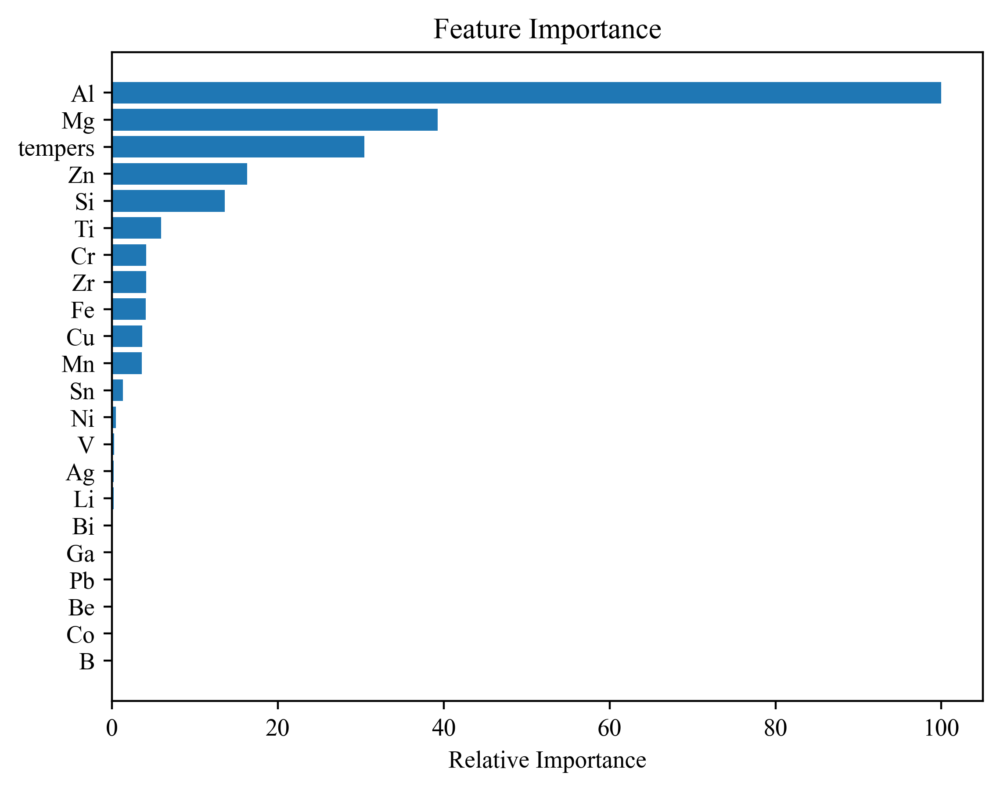

,model,RMSE,MAE,R2
0,RandomForest,15.77505,10.88096,0.870807


In [11]:
rfr = RandomForestRegressor(max_depth=15,n_estimators=1000,random_state=0)
model_dict = {"RandomForest":rfr}
# record the error
RMSE_list = []
MAE_list = []
R2_list = []

for model in model_dict.values():
    error_metric_testing = model_fit_evaluation(model, X_train, Y_train, X_test,Y_test, n_fold=5)
    RMSE_list.append(error_metric_testing["RMSE"])
    MAE_list.append(error_metric_testing["MAE"])
    R2_list.append(error_metric_testing["R2"])
result_df = pd.DataFrame({"model":list(model_dict.keys()),"RMSE":RMSE_list,
                          "MAE":MAE_list,"R2":R2_list})
features = dataset.drop([Y_columns],axis=1).columns
feature_importance = rfr.feature_importances_
draw_feature_importance(features,feature_importance)
result_df

In [12]:
rfr.fit(X_train, Y_train)
y_predict = rfr.predict(X_test)

In [13]:
R2 = round(error_metric_testing["R2"],2)
MAE = round(error_metric_testing["MAE"],2)
RMSE = round(error_metric_testing["RMSE"],2)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


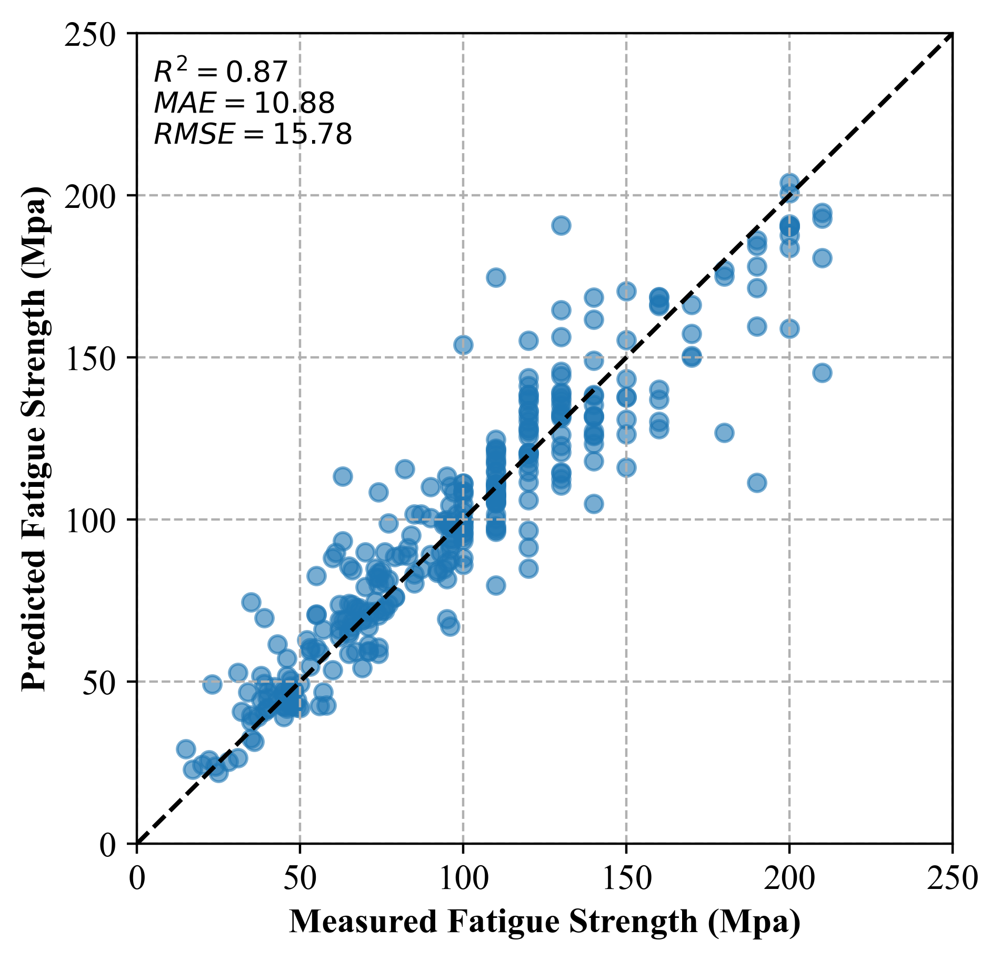

In [14]:
plt.figure(figsize=(5, 5), dpi=400)
plt.grid(linestyle="--")
plt.scatter(list(Y_test),list(y_predict),alpha=0.6)
plt.plot([0, 250], [0, 250],color='black',linestyle="--")

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Measured Fatigue Strength (Mpa)", fontsize=12, fontweight='bold')
plt.ylabel("Predicted Fatigue Strength (Mpa)", fontsize=12, fontweight='bold')
# set axis scale
plt.xlim(0, 250)
plt.ylim(0, 250)

plt.text(5,216,f"$R^2={R2}$\n$MAE={MAE}$\n$RMSE={RMSE}$")

plt.savefig('./FS_evaluation.eps', format='eps')
plt.show()

In [15]:
model_final = RandomForestRegressor(max_depth=15,n_estimators=1000,random_state=0)
model_final.fit(X,Y)
with open ("fatigue_strength_model.pickle", 'wb') as f:
    pickle.dump(model_final, f)

## predict fatigue strength

In [18]:
import pickle
#6 
# calculate fatigue_strength_prediction in S-N curve
with open ("le_tempers.txt", 'rb') as f:
    le = pickle.load(f)
with open ("fatigue_strength_model.pickle", 'rb') as f:
    model_fs = pickle.load(f)
    
dataset_main = pd.read_excel(r'./data.xlsx',sheet_name= "aluminium alloy data")
temps = le.transform(dataset_main["Temper"].values.reshape(-1,1))
dataset_Comp = pd.read_excel(r'./data.xlsx',sheet_name= "Composition")

# 元素weight df
X_column_element = ["Al","Fe","Si","Zn","Cu","V","Zr","Ag","Mn","Ni","Sn","Be","Ti","Mg","B","Ga","Cr","Pb","Bi","Li","Co"]
elements_col = ["Al","Si","Ti","Mn","Fe","Ni","Cu","Zn","Mg","Cr","Sn","Pb","Zr"]
df_element = pd.DataFrame(columns=X_column_element)
df_element = pd.concat([df_element,dataset_Comp[elements_col]]).fillna(0)
#df_element.append(dataset_Comp[elements_col]).fillna(0)
df_element["Composition"] = dataset_Comp["Composition"]


# get temps
df_temper = pd.DataFrame(temps,columns=["temps"])
df_temper["Composition"]= dataset_main["Composition"]
df_predict = pd.merge(df_element,df_temper, how='inner')
df_predict = df_predict.drop(["Composition"],axis=1)

# predict for 54  S-N curves
fs_predict = model_fs.predict(df_predict)
fs_predict

array([101.92400443, 101.92400443, 101.92400443, 101.92400443,
       101.92400443,  87.36633625,  88.40874892,  90.89462771,
        77.65921468,  90.93085735,  83.02503968,  91.01868501,
        89.61402632,  90.81344399,  90.7305    ,  91.325     ,
        91.325     , 117.99892063, 117.99892063, 117.99892063,
       194.80550315, 194.80550315, 194.80550315, 194.80550315,
       194.80550315, 194.80550315, 194.80550315, 194.80550315,
       194.80550315, 194.80550315, 192.54007656, 192.54007656,
       192.54007656, 192.54007656, 192.54007656, 189.74495752,
       189.74495752, 189.74495752, 189.74495752, 189.74495752,
       138.09655556, 138.09655556, 138.09655556, 138.09655556,
       138.09655556, 138.09655556, 138.09655556, 131.67233333,
       131.67233333, 131.67233333, 131.67233333, 131.67233333,
       131.67233333, 131.67233333])

In [63]:
df_predict.head(10)

,Al,Fe,Si,Zn,Cu,V,Zr,Ag,Mn,Ni,...,Ti,Mg,B,Ga,Cr,Pb,Bi,Li,Co,temps
0,68.7900,6.88,0.61,0.350,1.280,0,0.0,0,0.140,6.52,...,0.00,0.34,0,0,0.0,0.0,0,0,0,85
1,68.7900,6.88,0.61,0.350,1.280,0,0.0,0,0.140,6.52,...,0.00,0.34,0,0,0.0,0.0,0,0,0,85
2,68.7900,6.88,0.61,0.350,1.280,0,0.0,0,0.140,6.52,...,0.00,0.34,0,0,0.0,0.0,0,0,0,85
3,68.7900,6.88,0.61,0.350,1.280,0,0.0,0,0.140,6.52,...,0.00,0.34,0,0,0.0,0.0,0,0,0,85
4,68.7900,6.88,0.61,0.350,1.280,0,0.0,0,0.140,6.52,...,0.00,0.34,0,0,0.0,0.0,0,0,0,85
5,92.0893,0.06,7.10,0.005,0.010,0,0.0,0,0.005,0.00,...,0.13,0.60,0,0,0.0,0.0,0,0,0,53
6,92.0430,0.06,7.10,0.005,0.010,0,0.0,0,0.005,0.00,...,0.13,0.64,0,0,0.0,0.0,0,0,0,53
7,92.0870,0.06,7.10,0.005,0.010,0,0.0,0,0.005,0.00,...,0.10,0.62,0,0,0.0,0.0,0,0,0,53
8,91.4440,0.10,7.80,0.005,0.005,0,0.0,0,0.005,0.00,...,0.09,0.55,0,0,0.0,0.0,0,0,0,0
9,91.4440,0.10,7.80,0.005,0.005,0,0.0,0,0.005,0.00,...,0.09,0.55,0,0,0.0,0.0,0,0,0,53


In [66]:
le.classes_

array(['F', 'H11', 'H111', 'H112', 'H116', 'H12', 'H13', 'H14', 'H15',
       'H16', 'H17', 'H18', 'H19', 'H21', 'H22', 'H24', 'H25', 'H26',
       'H27', 'H28', 'H29', 'H32', 'H321', 'H322', 'H34', 'H36', 'H38',
       'O', 'T1', 'T11', 'T2', 'T3', 'T31', 'T351', 'T3510', 'T3511',
       'T36', 'T361', 'T37', 'T4', 'T42', 'T451', 'T4510', 'T4511',
       'T452', 'T5', 'T51', 'T52', 'T53', 'T54', 'T551', 'T5510', 'T5511',
       'T6', 'T61', 'T6151', 'T62', 'T64', 'T65', 'T651', 'T6510',
       'T6511', 'T652', 'T66', 'T7', 'T71', 'T72', 'T73', 'T7351',
       'T73510', 'T73511', 'T7352', 'T74', 'T7451', 'T7452', 'T7454',
       'T76', 'T7651', 'T76510', 'T76511', 'T8', 'T81', 'T83', 'T831',
       'T832', 'T851', 'T8510', 'T8511', 'T852', 'T861', 'T87', 'T9'],
      dtype=object)

In [160]:
# 7075-T651
df_predict_val = pd.read_csv("fs_predict.csv")
df_predict_val["temps"] = le.transform(df_predict_val["temps"])
fs_predict_val = model_fs.predict(df_predict_val)
print(f"fatigue strength for 7075-T651 is {fs_predict_val}")

fatigue strength for 7075-T651 is [164.18887131]


In [10]:
# save the prediction
np.savetxt("fs_predict.txt",fs_predict)

## shap

In [16]:
import shap
X = dataset.drop([Y_columns],axis=1)
explainer = shap.TreeExplainer(model_fs,feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(X)

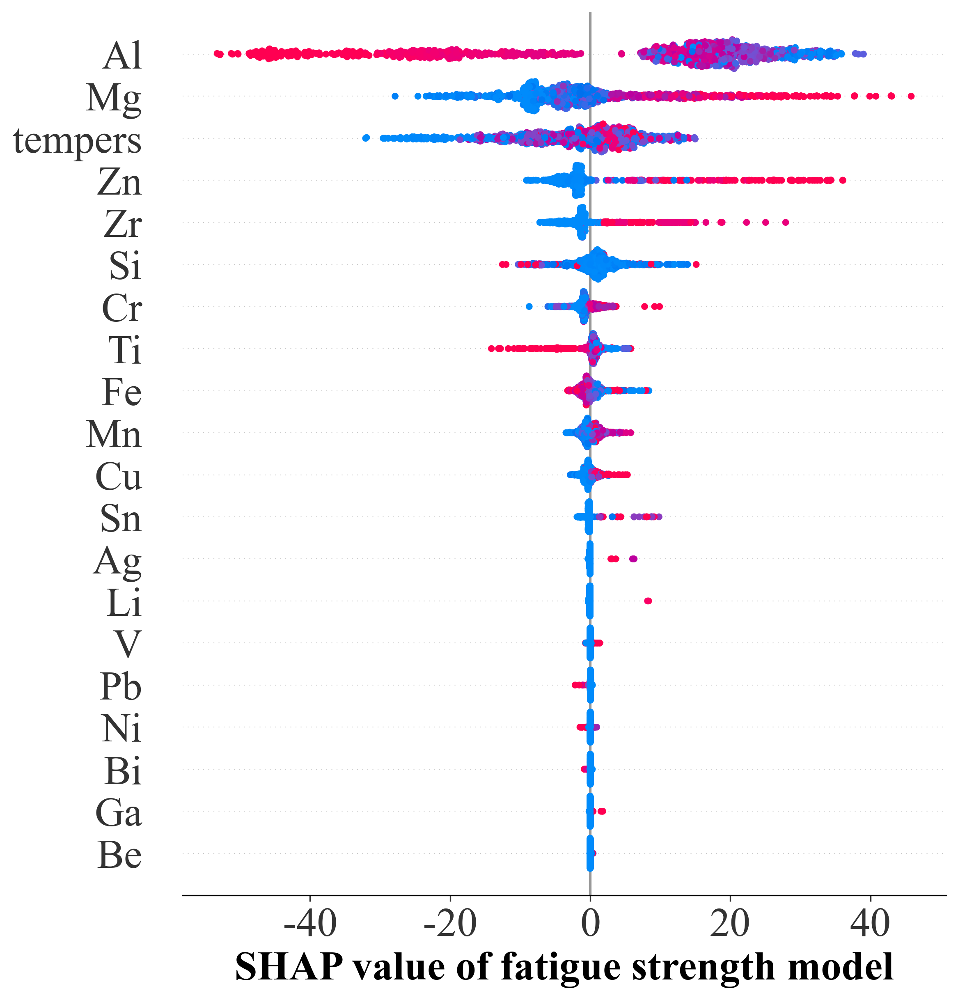

In [12]:
plt.figure(dpi=300)
shap.summary_plot(shap_values, X,show=False,color_bar=False)
plt.xlabel("SHAP value of fatigue strength model" ,fontweight='bold',fontsize=24)
plt.tick_params(labelsize=24,)
plt.show()

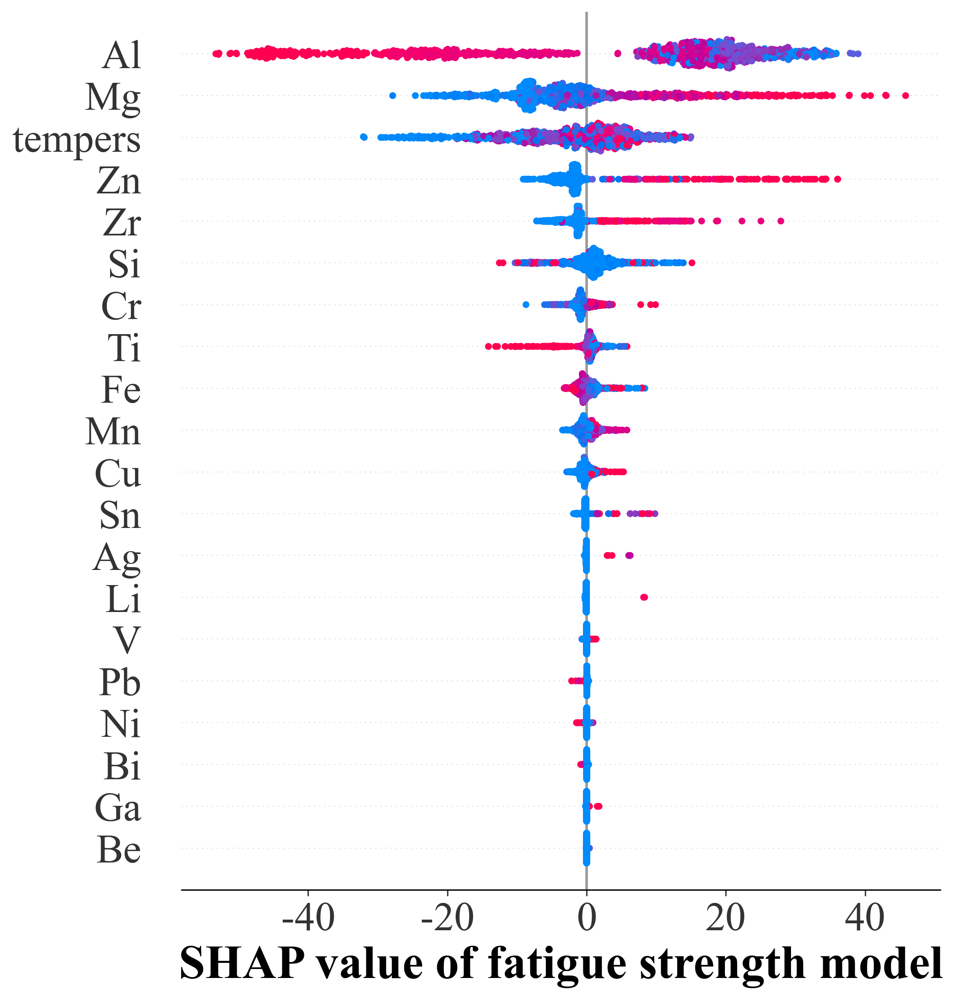

In [19]:
plt.figure(dpi=300)
shap.summary_plot(shap_values, X,show=False,color_bar=False)
plt.xlabel("SHAP value of fatigue strength model", fontweight='bold',fontsize=28)
plt.tick_params(labelsize=24,)
plt.show()

# S-N curve modeling

## data preprocessing

In [47]:
fs_predict = np.loadtxt("fs_predict.txt")

There are 54 S-N curves with 609 experiment points
There are runout 127 experiment points
one of the S-N curve


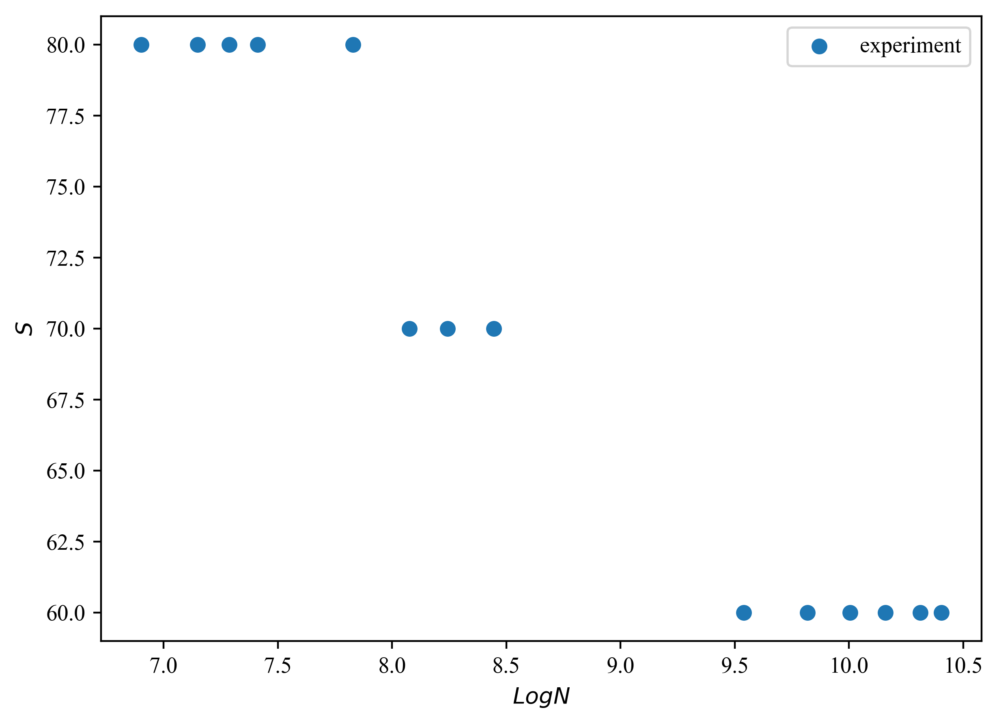

257
   S-N_index       N      S       LgN runout
0          1    6780  200.0  3.831230    NaN
1          1   26100  170.0  4.416641    NaN
2          1   47200  150.0  4.673942    NaN
3          1  108000  130.0  5.033424    NaN
4          1  594000  100.0  5.773786    NaN


In [48]:
dataset_main = pd.read_excel(r'./data.xlsx',sheet_name= "aluminium alloy data")
dataset_SN = pd.read_excel(r'./data.xlsx',sheet_name= "S_N curve")
dataset_Comp = pd.read_excel(r'./data.xlsx',sheet_name= "Composition")
dataset_main["Fatigue Strength"] = fs_predict
data_all = pd.merge(dataset_main, dataset_SN, how='inner')
print("There are {} S-N curves with {} experiment points".
      format(dataset_main.shape[0],dataset_SN.shape[0]))
print("There are runout {} experiment points".
      format(dataset_SN[dataset_SN["runout"]==">"].shape[0]))
print("one of the S-N curve")

# show one S-N
plt.figure(figsize=(7, 5), dpi=400)
df_temp = dataset_SN[dataset_SN["S-N_index"]==19]
plt.scatter(df_temp["LgN"],df_temp["S"],label="experiment")
plt.xlabel("$LogN$")
plt.ylabel("$S$")
plt.legend()
plt.show()

# exclude the runout data
dataset_SN = dataset_SN[dataset_SN["runout"]!=">"]
S_N_index = list(dataset_main["S-N_index"].unique())

# get averaged S-N curve
df_all = pd.merge(dataset_main, dataset_SN, how='inner')
coulumns = ["S-N_index","UTS","TYS","R","S","LgN","Fatigue Strength"]
# all data
df_curve = df_all[coulumns].groupby(["S-N_index","UTS","TYS","R","S","Fatigue Strength"],as_index=False).mean()

print("{}".format(df_curve.shape[0]))
print(dataset_SN.head())

## feature engenering

In [49]:
# used for LOOGV
groups_array = np.array(df_curve["S-N_index"])

# feature engenering
df_curve["$Logσ_{a}$"]=df_curve["S"].apply(np.log10)
df_curve["Stussi"] = (df_curve["UTS"]-df_curve["S"])/(df_curve["S"]-df_curve["Fatigue Strength"]+100)
df_curve["Stussi"] = df_curve["Stussi"].apply(np.log)

df_curve["$σ_{a}^3$"]= df_curve["S"].apply(lambda x: np.power(x,3))
df_curve["$σ_{a}^2$"]= df_curve["S"].apply(lambda x: np.power(x,2))
df_curve["$σ_{a}^{0.5}$"]= df_curve["S"].apply(np.sqrt)
df_curve["$σ_{a}^{0.1}$"]=df_curve["S"].apply(lambda x: np.power(x,0.1))


Smin = "$σ_{min}$"
Smax = "$σ_{max}$"
Savg = "$σ_{m}$"
df_curve[Smax] = 2*df_curve["S"]/(1-df_curve["R"])
df_curve[Smin] = df_curve[Smax]*df_curve["R"]
df_curve[Savg] = (np.abs(df_curve[Smin])+np.abs(df_curve[Smax]))/2

# Smin
df_curve["$σ_{min}^{0.1}$"]=abs(df_curve[Smin]).apply(lambda x: np.power(x,0.1))
df_curve["$σ_{min}^{0.5}$"]=abs(df_curve[Smin]).apply(np.sqrt)
df_curve["$σ_{min}^{1.5}$"]=abs(df_curve[Smin]).apply(lambda x: np.power(x,1.5))
df_curve["$σ_{min}^2$"]=df_curve[Smin].apply(lambda x: np.power(x,2))
df_curve["$σ_{min}^{2.5}$"]=abs(df_curve[Smin]).apply(lambda x: np.power(x,2.5))
df_curve["$σ_{min}^3$"]=df_curve[Smin].apply(lambda x: np.power(x,3))
# Smax                                 
df_curve["$σ_{max}^{0.1}$"]=abs(df_curve[Smax]).apply(lambda x: np.power(x,0.1))                                          
df_curve["$σ_{max}^{0.5}$"]=abs(df_curve[Smax]).apply(np.sqrt)
df_curve["$σ_{max}^{1.5}$"]=abs(df_curve[Smax]).apply(lambda x: np.power(x,1.5))
df_curve["$σ_{max}^2$"]=df_curve[Smax]*df_curve[Smax]
df_curve["$σ_{max}^{2.5}$"]=abs(df_curve[Smax]).apply(lambda x: np.power(x,2.5))
df_curve["$σ_{max}^3$"]=df_curve[Smax]*df_curve[Smax]*df_curve[Smax]
c = list(df_curve.columns)
c[4] = "$σ_{a}$"
df_curve.columns = c

X = df_curve.drop(["S-N_index","LgN"],axis=1).values
X_columns = df_curve.drop(["S-N_index","LgN"],axis=1).columns
Y = df_curve["LgN"]
index = df_curve["S-N_index"]
features = df_curve.drop(["S-N_index","LgN"],axis=1).columns
Y_column = "LgN"
df_curve.head(10)

,S-N_index,UTS,TYS,R,$σ_{a}$,Fatigue Strength,LgN,$Logσ_{a}$,Stussi,$σ_{a}^3$,...,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{min}^3$,$σ_{max}^{0.1}$,$σ_{max}^{0.5}$,$σ_{max}^{1.5}$,$σ_{max}^2$,$σ_{max}^{2.5}$,$σ_{max}^3$
0,1,464,438,0.1,80.0,101.924004,7.496930,1.903090,1.592960,512000.0,...,74.957693,316.049383,1332.581203,5618.655693,1.678757,13.333333,2370.370370,31604.938272,4.213992e+05,5.618656e+06
1,1,464,438,0.1,100.0,101.924004,5.773786,2.000000,1.311411,1000000.0,...,104.756560,493.827160,2327.923559,10973.936900,1.716638,14.907120,3312.693300,49382.716049,7.361541e+05,1.097394e+07
2,1,464,438,0.1,130.0,101.924004,5.033424,2.113943,0.958517,2197000.0,...,155.273112,834.567901,4485.667685,24109.739369,1.762273,16.996732,4910.166939,83456.790123,1.418493e+06,2.410974e+07
3,1,464,438,0.1,150.0,101.924004,4.673942,2.176091,0.751667,3375000.0,...,192.450090,1111.111111,6415.002991,37037.037037,1.787672,18.257419,6085.806195,111111.111111,2.028602e+06,3.703704e+07
4,1,464,438,0.1,170.0,101.924004,4.416641,2.230449,0.559164,4913000.0,...,232.195934,1427.160494,8771.846414,53914.951989,1.810188,19.436506,7342.680164,142716.049383,2.773901e+06,5.391495e+07
5,1,464,438,0.1,200.0,101.924004,3.831230,2.301030,0.287298,8000000.0,...,296.296296,1975.308642,13168.724280,87791.495199,1.839847,21.081851,9369.711586,197530.864198,4.164316e+06,8.779150e+07
6,2,464,438,0.1,80.0,101.924004,6.610660,1.903090,1.592960,512000.0,...,74.957693,316.049383,1332.581203,5618.655693,1.678757,13.333333,2370.370370,31604.938272,4.213992e+05,5.618656e+06
7,2,464,438,0.1,90.0,101.924004,6.167317,1.954243,1.446056,729000.0,...,89.442719,400.000000,1788.854382,8000.000000,1.698646,14.142136,2828.427125,40000.000000,5.656854e+05,8.000000e+06
8,2,464,438,0.1,100.0,101.924004,5.413300,2.000000,1.311411,1000000.0,...,104.756560,493.827160,2327.923559,10973.936900,1.716638,14.907120,3312.693300,49382.716049,7.361541e+05,1.097394e+07
9,2,464,438,0.1,110.0,101.924004,5.176091,2.041393,1.186462,1331000.0,...,120.856568,597.530864,2954.271661,14606.310014,1.733078,15.634719,3821.820249,59753.086420,9.342227e+05,1.460631e+07


### feature selection

In [54]:
# independent testing set
test_index = [4,6,9,15,18,21,41]
df_test = pd.DataFrame()

# split train and test [each alloy extract one curve for test]
df_train = pd.DataFrame()
for test_curve in test_index:
    df_test = pd.concat([df_test,df_curve[df_curve["S-N_index"]==test_curve]])
for train_curve in list(set(index) - set(test_index)):
    df_train = pd.concat([df_train,df_curve[df_curve["S-N_index"]==train_curve]])

groups_array_train = np.array(df_train["S-N_index"])
features = X_columns
X_train, X_test = df_train[features],  df_test[features]
Y_train, Y_test = df_train[Y_column],  df_test[Y_column]

model = GradientBoostingRegressor(random_state=0)
print(X_train.shape)

(216, 26)


In [55]:
best_features="TYS,Fatigue Strength,Stussi,$σ_{a}^3$,$σ_{a}^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$".split(",")
best_features

['TYS',
 'Fatigue Strength',
 'Stussi',
 '$σ_{a}^3$',
 '$σ_{a}^2$',
 '$σ_{min}^{0.1}$',
 '$σ_{min}^{1.5}$',
 '$σ_{min}^2$',
 '$σ_{min}^{2.5}$',
 '$σ_{max}^{1.5}$']

In [46]:
get_score_logcv(df_train[best_features],Y_train,groups_array_train,model)

1.39897827593631

In [56]:
import os
groups_array_train = np.array(df_train["S-N_index"])
model = GradientBoostingRegressor(random_state=0)
metric = c
print(X_train.shape)
print(Y_train.shape)
print(len(groups_array_train))
if os.path.exists("feature_selection.xlsx"):
    result_df_feature_selection = pd.read_excel("feature_selection.xlsx")
else:
    result_df_feature_selection = back_forward_feature_selection(model, X_train, Y_train, get_score_logcv,groups_array_train)

(216, 26)
(216,)
216


In [11]:
fs_groupby = result_df_feature_selection.groupby(["n_feature"],as_index=False).min()
fs_groupby

,n_feature,features,metric
0,1,$σ_{max}^{1.5}$,13.210094
1,2,"Fatigue Strength,$σ_{max}^{1.5}$",3.479475
2,3,"Fatigue Strength,Stussi,$σ_{max}^{1.5}$",2.374815
3,4,"Fatigue Strength,Stussi,$σ_{a}^2$,$σ_{max}^{1.5}$",1.979335
4,5,"Fatigue Strength,Stussi,$σ_{a}^2$,$σ_{min}^{0....",1.564216
5,6,"Fatigue Strength,Stussi,$σ_{a}^3$,$σ_{a}^2$,$σ...",1.424004
6,7,"Fatigue Strength,Stussi,$σ_{a}^3$,$σ_{a}^2$,$σ...",1.441486
7,8,"Fatigue Strength,Stussi,$σ_{a}^3$,$σ_{a}^2$,$σ...",1.441982
8,9,"Fatigue Strength,Stussi,$σ_{a}^3$,$σ_{a}^2$,$σ...",1.443153
9,10,"Fatigue Strength,Stussi,$σ_{a}^3$,$σ_{a}^2$,$σ...",1.398922


In [53]:
# get the best features
result_best = result_df_feature_selection.sort_values(["metric"]).reset_index()
best_features = result_best.loc[0]["features"].split(",")
best_features

['TYS',
 'Fatigue Strength',
 'Stussi',
 '$σ_{a}^3$',
 '$σ_{a}^2$',
 '$σ_{min}^{0.1}$',
 '$σ_{min}^{1.5}$',
 '$σ_{min}^2$',
 '$σ_{min}^{2.5}$',
 '$σ_{max}^{1.5}$']

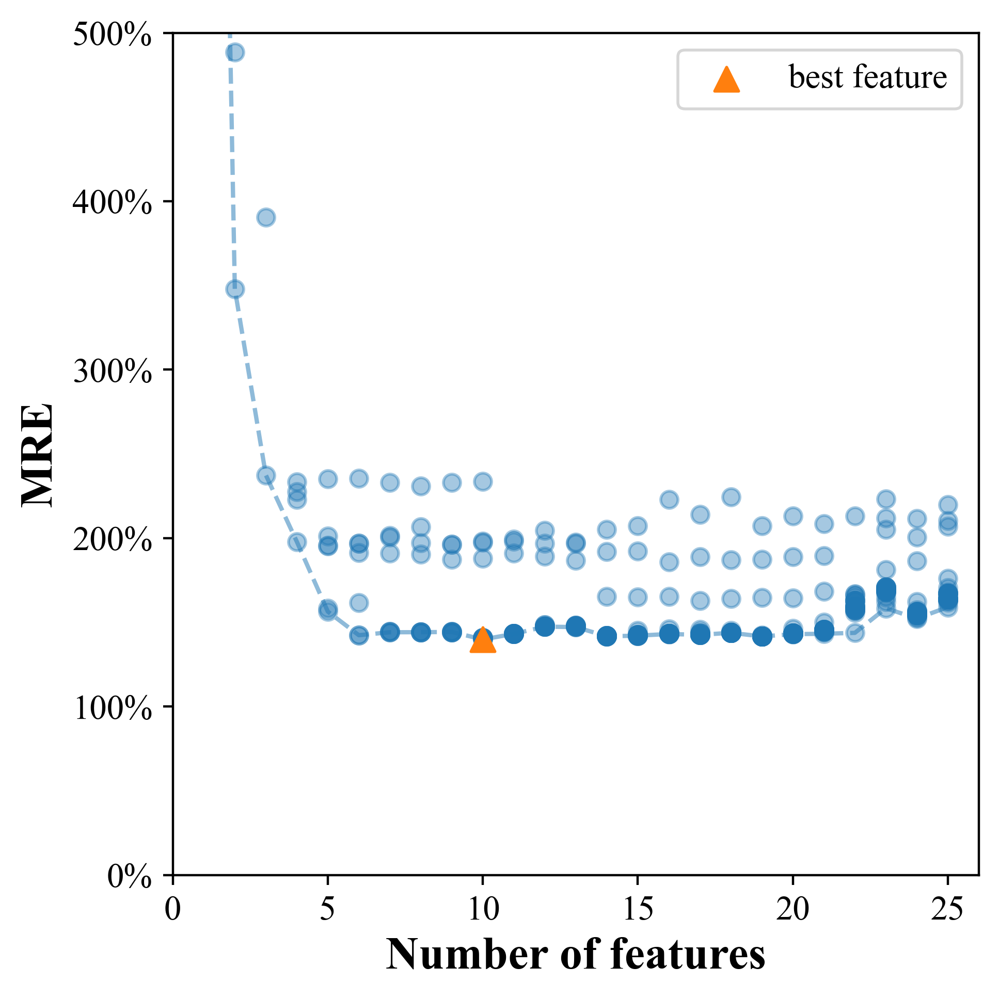

In [59]:
best_feature_number = len(best_features)
plt.figure(figsize=(5, 5), dpi=400)
plt.scatter(result_df_feature_selection["n_feature"],result_df_feature_selection["metric"],alpha=0.4)
plt.scatter([best_feature_number],fs_groupby["metric"][best_feature_number-1],label="best feature",marker="^",s=70,zorder=2)
plt.plot(fs_groupby["n_feature"],fs_groupby["metric"],"--",alpha = 0.5,zorder=1)

#line.set_zorder(1)
from matplotlib import ticker
from matplotlib.ticker import PercentFormatter
plt.gca().yaxis.set_major_formatter(PercentFormatter(xmax=1,decimals=0))
plt.xlabel("Number of features", fontsize=16, fontweight='bold')
plt.ylabel("MRE", fontsize=16, fontweight='bold')
plt.xlim(0, 26)  
plt.ylim(0, 5)
plt.legend()
plt.tight_layout()
plt.savefig(f'./sfs_feature_selection.svg', format='svg')

In [25]:
# back_forward_feature_selection
def back_forward_feature_selection(model, X_train, Y_train, metric,groups_array_train):
    """
    model: instance of regressor
    X_train Y_train is dataFrame
    metric is evalucation function for feature selection 
    metric：calculate score lower score is better
    return metric for each step
    
    """
    # record result
    result_df = pd.DataFrame()
    features = X_train.columns
    best_score = 1e10
    best_features = features
    features_number = len(best_features)
    print("input features",features_number)

    for i in range(len(features) - 1):
        print("feature number",len(best_features))
        # once back and find the best features for this number of features
        best_score = 1e10
        for sub_features in itertools.combinations(best_features, features_number - 1):
            sub_features = list(sub_features)
            #print(sub_features)
#             if "groups_array_train" in agrs.keys():
            score = metric(X_train[sub_features],Y_train,groups_array_train,model)
                #print(score)
#             else:
#                 score = metric(X_train[sub_features],Y_train,model)
#             model.fit(X_train[sub_features], Y_train)
#             score = metric(Y_validation, model.predict(X_validation[sub_features]))
            df_line = pd.DataFrame(
                {"features": [",".join(sub_features)], "metric": score, "n_feature": len(sub_features)})
            result_df = result_df.append(df_line, ignore_index=True)
            if (best_score > score):
                best_score = score
                best_features = sub_features
            print(best_score)
        # for debug
        # print("best_features",best_features)
        # print("best_score",best_score)
        features_number = len(best_features)
    # find the best feature
    result_df = result_df.sort_values(by="metric", ascending=False)
    return result_df

In [38]:
best_features="TYS,Fatigue Strength,Stussi,$σ_{a}^3$,$σ_{a}^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$".split(",")

### model evalucation

['TYS', 'Fatigue Strength', 'Stussi', '$σ_{a}^3$', '$σ_{a}^2$', '$σ_{min}^{0.1}$', '$σ_{min}^{1.5}$', '$σ_{min}^2$', '$σ_{min}^{2.5}$', '$σ_{max}^{1.5}$']
MRE： 1.3989782759363092
样本个数  216
均方根误差RMSE  0.529
均方差MSE  0.279
平均绝对误差MAE  0.399
R2： 0.798


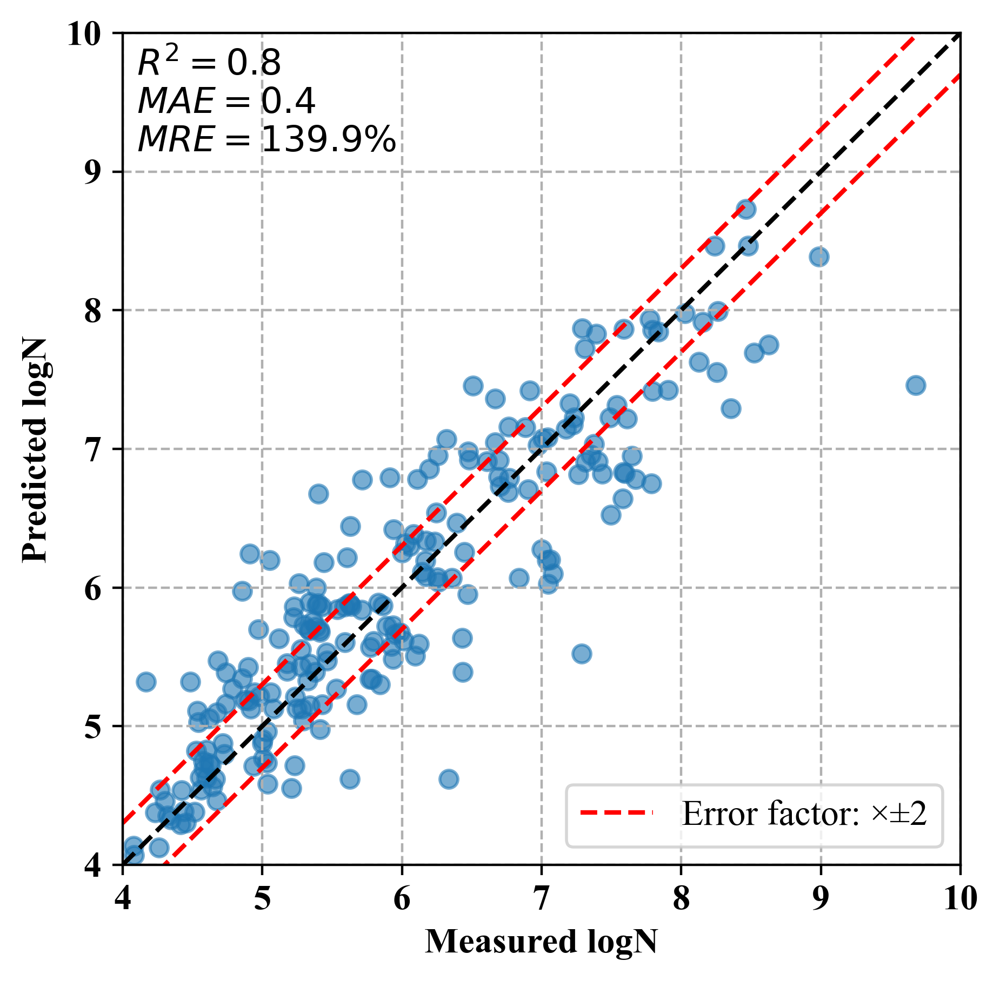

In [57]:
# setting
model_name = "S-N curve"
features = best_features
model = GradientBoostingRegressor(random_state=0)
plt.rc('font',family='Times New Roman',size=12)
from sklearn.model_selection import LeaveOneGroupOut
logo = LeaveOneGroupOut()
y_predict_list = []
y_true_list = []
index_list = []

x = df_train[features].values
y = df_train["LgN"].values
groups_array = df_train["S-N_index"]
#x = df_curve[X_columns].values
print(features)
for train_index, test_index in logo.split(x, y, groups_array):# 根据合金的名称将其分组
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x[train_index], x[test_index]
    Y_train, Y_test = y[train_index], y[test_index]
    
    
    #model = Linear_SVR()
    #model = LinearRegression()
    model.fit(X_train,Y_train)
    
    y_predict_list.extend(model.predict(X_test))
    y_true_list.extend(Y_test)
    index_list.extend(index[test_index])
# calculate mre
mre = mean_relative_error(np.power(10,y_true_list), np.power(10,y_predict_list))
print("MRE：",mre)

evalucation_matrix = evaluate_model_plot(y_true_list,y_predict_list,show=False)

# true
y_true = y_true_list
y_predict = y_predict_list
plt.figure(figsize=(5, 5), dpi=400)
plt.rcParams['font.sans-serif'] = ['Arial']  # 设置字体
plt.rcParams['axes.unicode_minus'] = False  # 显示负号
plt.grid(linestyle="--")  # 设置背景网格线为虚线
ax = plt.gca()  # 获取坐标轴对象
plt.scatter(y_true, y_predict,alpha=0.6)

import math

plt.plot([4, 10], [4, 10], color='black',linestyle="--")
error_lines_gap = math.log10(2)
plt.plot([4, 10], [4+error_lines_gap, 10+error_lines_gap], color='red',linestyle="--",label = "Error factor: ×±2")
plt.plot([4, 10], [4-error_lines_gap, 10-error_lines_gap], color='red',linestyle="--")
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel("Measured logN", fontsize=12, fontweight='bold')
plt.ylabel("Predicted logN", fontsize=12, fontweight='bold')
plt.xlim(4, 10)  # 设置x轴的范围
plt.ylim(4, 10)
plt.text(4.1,9.15,"$R^2={r2}$\n$MAE={MAE}$\n$MRE={MRE}\%$".format(r2=round(evalucation_matrix["R2"],2)
                                                                ,MAE=round(evalucation_matrix["MAE"],2)
                                                                ,MRE=round(mre*100,1)
                                                              ))
plt.savefig(f'./sn_evaluation_{model_name}.svg', format='svg')
plt.legend(loc="lower right")
plt.show()

In [58]:
# testing set
test_index = [4,6,9,15,18,21,41]
df_test = pd.DataFrame()
for test_curve in test_index:
    df_test = pd.concat([df_test, df_curve[df_curve["S-N_index"]==test_curve]])
df_test["S-N_index"].unique()

features = best_features

y_predict_list = []
y_true_list = []
index_list = []
X_train, X_test = df_train[features], df_test[features]
Y_train, Y_test = df_train[Y_column], df_test[Y_column]
model = GradientBoostingRegressor(random_state=0)
model.fit(X_train[features],Y_train)
y_predict_list.extend(model.predict(X_test[features]))
y_true_list.extend(Y_test)
index_list.extend(df_test["S-N_index"])
# 相对误差
mre = fatigue_mre_metric(y_true_list, y_predict_list)
print("MRE:",mre)

MRE: 1.0535702056261533


In [27]:
dataset_SN["$σ_{a}$"] = dataset_SN["S"]

In [28]:
dataset_SN.columns = ["$σ_{a}$"  if i=="S" else i for i in dataset_SN.columns]

<Figure size 432x288 with 0 Axes>

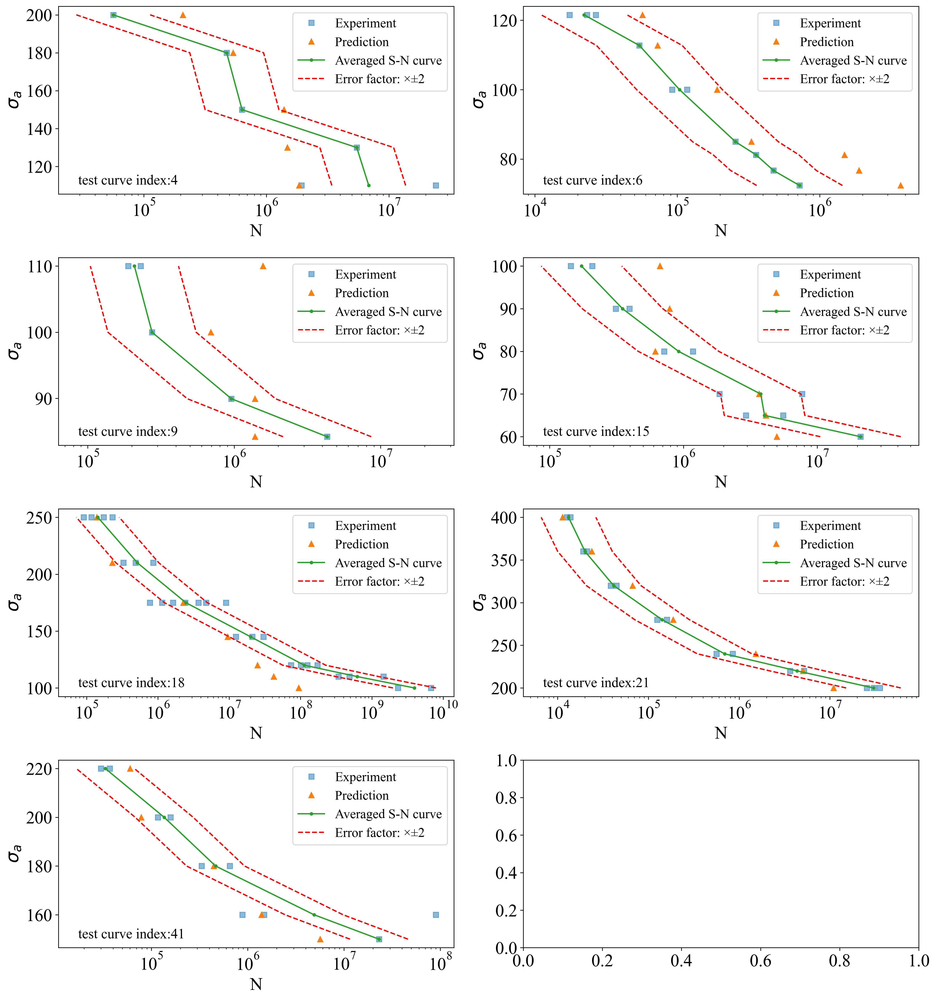

In [112]:
test_index = [4,6,9,15,18,21,41]
#误差可视化
result_df = pd.DataFrame({"S-N_index":index_list,"y_true":y_true_list,"y_predict":y_predict_list})
plt.subplots_adjust(hspace=0.5,wspace=0.5)
row = 4
col = 2

fig, axes = plt.subplots(row,col, figsize=(15, row*4)
                         ,dpi=300)
plt.xticks(fontsize=12)
for i, ax in enumerate(axes.flat):
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)
    if(i<len(list(test_index))):
        # 数据准备
        draw_index = test_index[i]
        every_test_curve = df_curve.loc[df_curve["S-N_index"]==draw_index,:]
        test_sn = dataset_SN.loc[dataset_SN["S-N_index"]==draw_index,:]
        df_test_ml = pd.merge(dataset_main, test_sn, how='inner')
        
        # 实验数据
        ax.semilogx(df_test_ml["N"],df_test_ml["$σ_{a}$"],'.',Marker='s',label="Experiment",alpha=0.5)
        
        # predict
        every_test_curve["y_pred"] = list(result_df.loc[result_df["S-N_index"]==draw_index,"y_predict"])
        every_test_curve["y_pred_N"] = every_test_curve.loc[:,"y_pred"].apply(lambda x:pow(10,x))
        every_test_curve["y_N"] = every_test_curve.loc[:,"LgN"].apply(lambda x:pow(10,x))
      
        # draw S-N curve in ax
        ax.semilogx(every_test_curve["y_pred_N"],every_test_curve["$σ_{a}$"],'.',Marker='^',label="Prediction")
        ax.semilogx(every_test_curve["y_N"],every_test_curve["$σ_{a}$"],'-',Marker='.',label="Averaged S-N curve")
        ax.semilogx(2*every_test_curve["y_N"],every_test_curve["$σ_{a}$"],'--',label = "Error factor: ×±2",c="red")
        ax.semilogx(0.5*every_test_curve["y_N"],every_test_curve["$σ_{a}$"],'--',c="red")
        
        if draw_index == 9:
            ax.set_xlim(10**(4.8),10**(7.5))
        
        # annotation
        ax.set_ylabel("$σ_{a}$",fontsize=20)
        ax.set_xlabel("N",fontsize=20)
        ax.text(0.05, 0.05, "test curve index:"+str(draw_index),transform=ax.transAxes, color='black',fontsize=16)
        ax.legend(fontsize=15)
fig.tight_layout()

<Figure size 432x288 with 0 Axes>

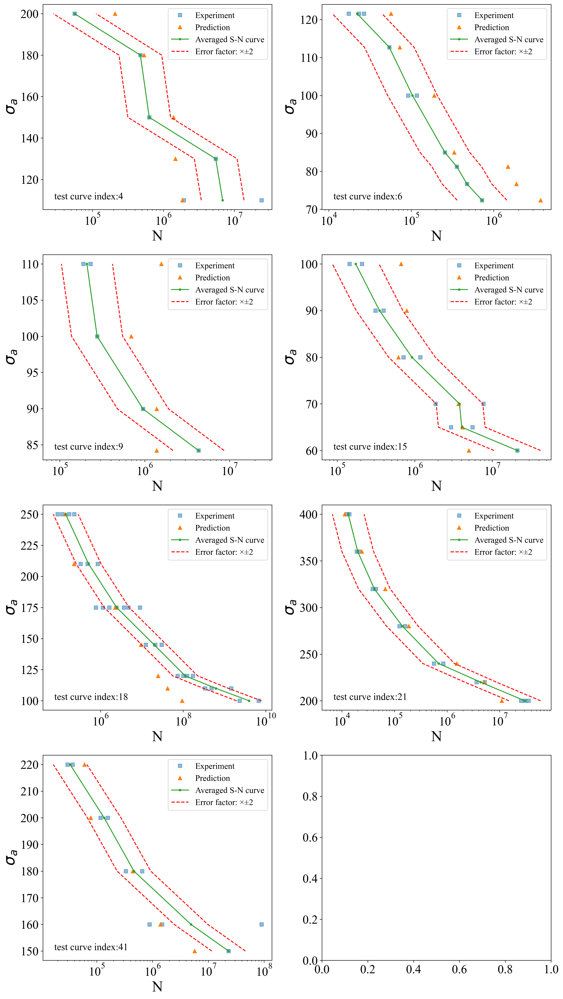

In [15]:
## bigger font size 
test_index = [4,6,9,15,18,21,41]
#误差可视化
result_df = pd.DataFrame({"S-N_index":index_list,"y_true":y_true_list,"y_predict":y_predict_list})
plt.subplots_adjust(hspace=0.5,wspace=0.5)
row = 4
col = 2

fig, axes = plt.subplots(row,col, figsize=(13, 23)
                         ,dpi=300)
plt.xticks(fontsize=20)
for i, ax in enumerate(axes.flat):
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)
    if(i<len(list(test_index))):
        # 数据准备
        draw_index = test_index[i]
        every_test_curve = df_curve.loc[df_curve["S-N_index"]==draw_index,:]
        test_sn = dataset_SN.loc[dataset_SN["S-N_index"]==draw_index,:]
        df_test_ml = pd.merge(dataset_main, test_sn, how='inner')
        
        # 实验数据
        ax.semilogx(df_test_ml["N"],df_test_ml["$σ_{a}$"],'.',Marker='s',label="Experiment",alpha=0.5)
        
        # predict
        every_test_curve["y_pred"] = list(result_df.loc[result_df["S-N_index"]==draw_index,"y_predict"])
        every_test_curve["y_pred_N"] = every_test_curve.loc[:,"y_pred"].apply(lambda x:pow(10,x))
        every_test_curve["y_N"] = every_test_curve.loc[:,"LgN"].apply(lambda x:pow(10,x))
      
        # draw S-N curve in ax
        ax.semilogx(every_test_curve["y_pred_N"],every_test_curve["$σ_{a}$"],'.',Marker='^',label="Prediction")
        ax.semilogx(every_test_curve["y_N"],every_test_curve["$σ_{a}$"],'-',Marker='.',label="Averaged S-N curve")
        ax.semilogx(2*every_test_curve["y_N"],every_test_curve["$σ_{a}$"],'--',label = "Error factor: ×±2",c="red")
        ax.semilogx(0.5*every_test_curve["y_N"],every_test_curve["$σ_{a}$"],'--',c="red")
        
        if draw_index == 9:
            ax.set_xlim(10**(4.8),10**(7.5))
        
        # annotation
        ax.set_ylabel("$σ_{a}$", fontsize=25)
        ax.set_xlabel("N", fontsize=25)
        ax.text(0.05, 0.05, "test curve index:"+str(draw_index),transform=ax.transAxes, color='black',fontsize=16)
        ax.legend(fontsize=14)
fig.tight_layout()

In [ ]:
## add error lines
test_index = [4,6,9,15,18,21,41]
#误差可视化
result_df = pd.DataFrame({"S-N_index":index_list,"y_true":y_true_list,"y_predict":y_predict_list})
plt.subplots_adjust(hspace=0.5,wspace=0.5)
row = 4
col = 2

fig, axes = plt.subplots(row,col, figsize=(15, row*4)
                         ,dpi=300)
plt.xticks(fontsize=12)
for i, ax in enumerate(axes.flat):
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)
    if(i<len(list(test_index))):
        # 数据准备
        draw_index = test_index[i]
        every_test_curve = df_curve.loc[df_curve["S-N_index"]==draw_index,:]
        test_sn = dataset_SN.loc[dataset_SN["S-N_index"]==draw_index,:]
        df_test_ml = pd.merge(dataset_main, test_sn, how='inner')
        # 实验数据
        ax.semilogx(df_test_ml["N"],df_test_ml["$σ_{a}$"],'.',Marker='s',label="experiment")
        # predict
        every_test_curve["y_pred"] = list(result_df.loc[result_df["S-N_index"]==draw_index,"y_predict"])
        every_test_curve["y_pred_N"] = every_test_curve.loc[:,"y_pred"].apply(lambda x:pow(10,x))
      
        # draw S-N curve in ax
        ax.semilogx(every_test_curve["y_pred_N"],every_test_curve["$σ_{a}$"],'.',Marker='.',label="prediction")
        # annotation
        ax.set_ylabel("$σ_{a}$",fontsize=20)
        ax.set_xlabel("N",fontsize=20)
        ax.text(0.05, 0.05, "test curve index:"+str(draw_index),transform=ax.transAxes, color='black',fontsize=16)
        ax.legend(fontsize=15)
fig.tight_layout()

<Figure size 3000x3000 with 0 Axes>

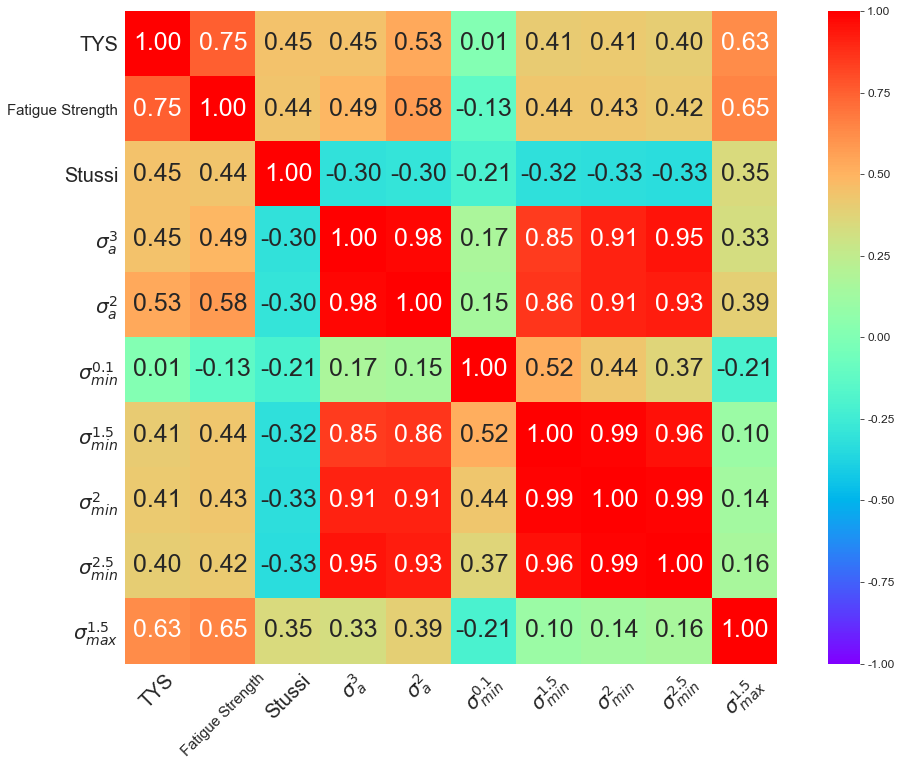

In [54]:
plt.figure(figsize=(10, 10), dpi=300)
cor = df_curve[best_features].corr()
mask = np.zeros_like(cor)
with sns.axes_style("white"):
    ax = sns.heatmap(cor, annot=True,annot_kws={"size": 25},fmt=".2f",
                     cmap="rainbow",linewidths=0,vmin=-1,vmax=1,mask=mask, square=True)
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)
    i = 0
    for tick in ax.get_xticklabels():
        tick.set_rotation(45)
        i=i+1
        if i == 2:
            tick.set_fontsize('15')
        #tick.set_fontweight()
    i = 0
    for tick in ax.get_yticklabels():
        i=i+1
        if i == 2:
            tick.set_fontsize('15')
        #tick.set_fontweight()
    fig = ax.get_figure()
    fig.savefig("heatmap.svg", dpi=300)

##  PCC

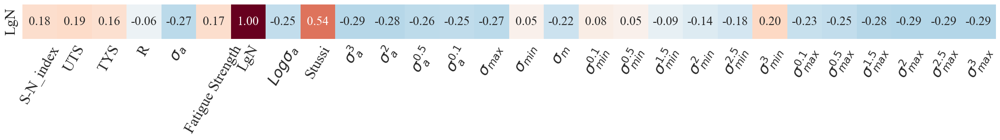

In [31]:

c = list(df_curve.columns)
c[4] = "$σ_{a}$"
df_curve.columns = c

X = df_curve.drop(["S-N_index","LgN"],axis=1).values
X_columns = df_curve.drop(["S-N_index","LgN"],axis=1).columns
Y = df_curve["LgN"]
index = df_curve["S-N_index"]
features = df_curve.drop(["S-N_index","LgN"],axis=1).columns
Y_column = "LgN"
cor = df_curve.corr()
with sns.axes_style("white"):
    plt.rc('font',family='Times New Roman',size=24)
    #plt.figure(figsize=(10, 10), dpi=1000)
    f, ax = plt.subplots(figsize=(28,1))
    ax = sns.heatmap(cor.loc[["LgN"],c], annot=True,annot_kws={"size": 20},fmt=".2f",
                     cmap=plt.cm.RdBu_r 
                     #
                     ,cbar=False,
                     linewidths=0,vmin=-1,vmax=1#,mask=mask
                    )
    plt.xticks(rotation=60)
    plt.savefig("corr2.png",dpi=600,bbox_inches="tight")

### shap

In [163]:
X = df_curve[best_features]
explainer = shap.TreeExplainer(model,feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(X)

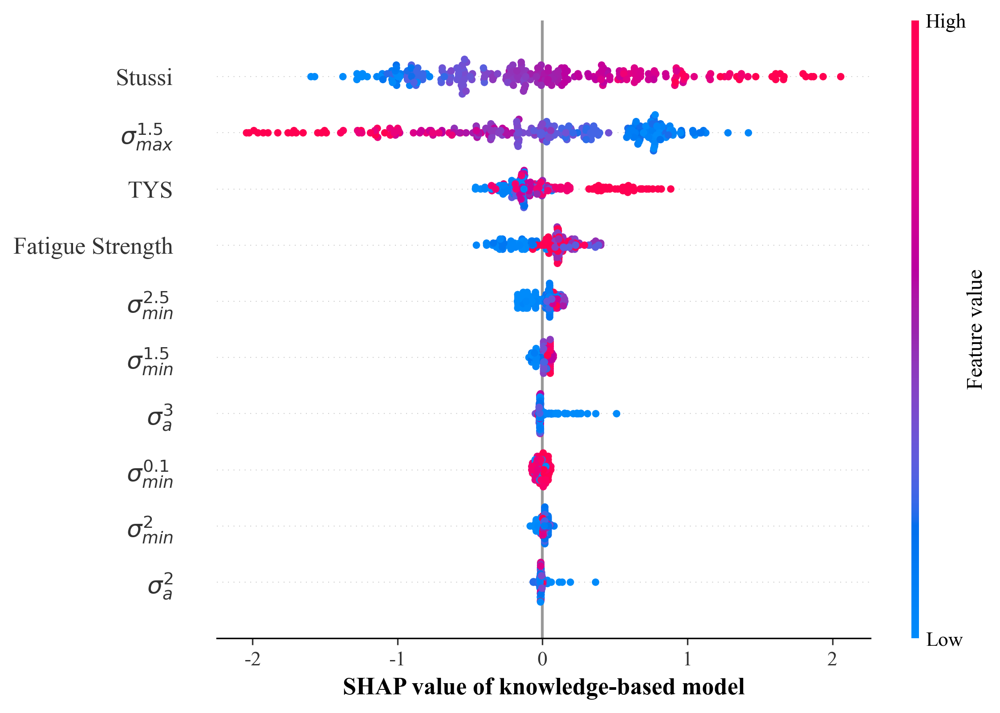

In [47]:
plt.figure(figsize=(5, 10),dpi=300)         
shap.summary_plot(shap_values, X, show=False)
plt.xlabel("SHAP value of knowledge-based model" , fontweight='bold')
plt.tight_layout()
plt.savefig('./SN_shap_domain.png')
plt.show()

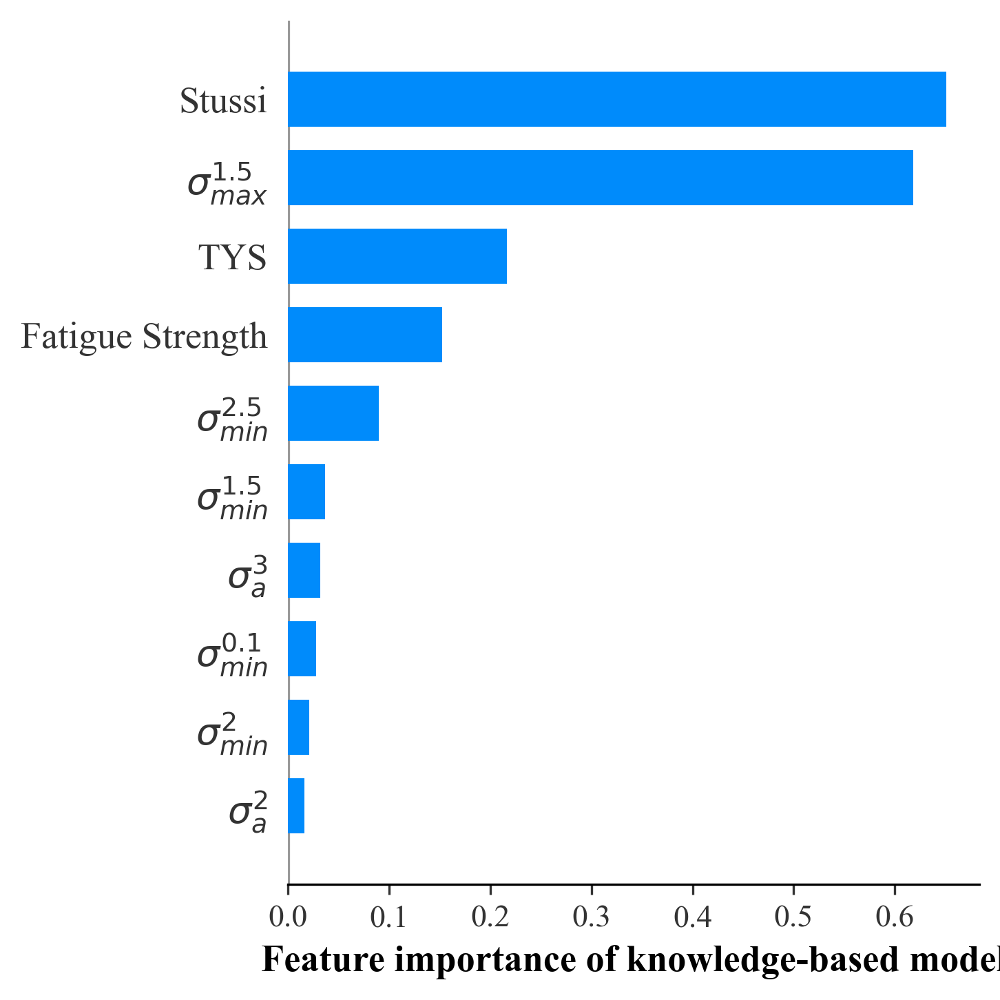

In [48]:
model_name = "knowledge-based"
plt.figure(figsize=(5, 10),dpi=300)
shap.summary_plot(shap_values, X, plot_type="bar",show=False)
fig = plt.gcf()
fig.set_size_inches(5,5)
plt.xlabel(f"Feature importance of {model_name} model" , fontweight='bold')
plt.tight_layout()
plt.savefig(f'./SN_feature_importance_{model_name}.png')
plt.show()

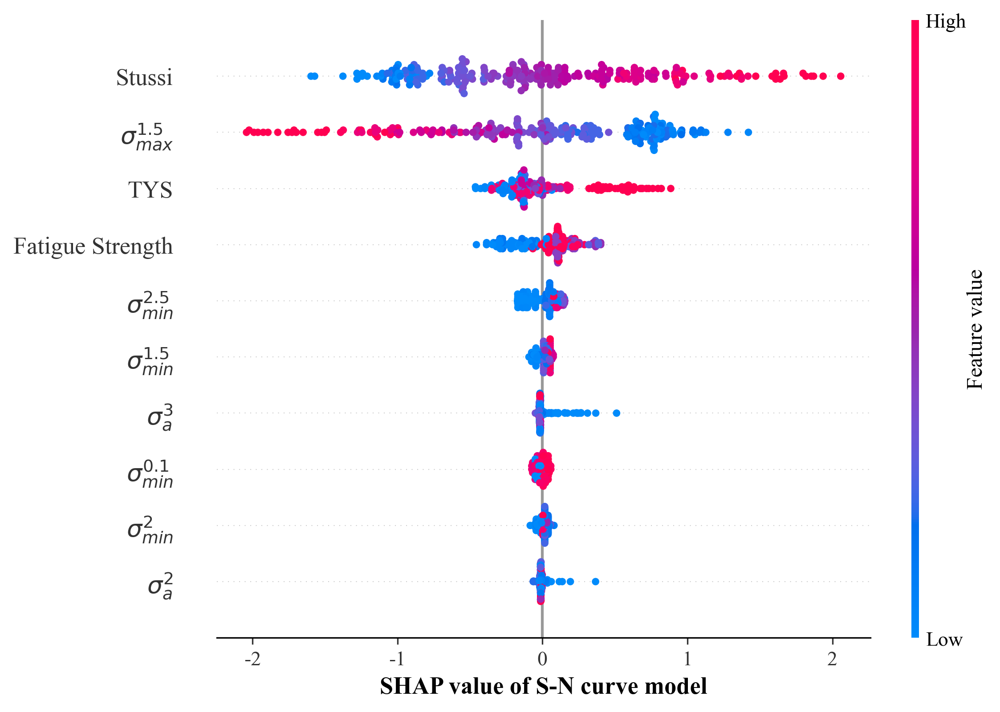

In [44]:
plt.figure(figsize=(5, 10),dpi=300)         
shap.summary_plot(shap_values, X,show=False)
plt.xlabel("SHAP value of S-N curve model" , fontweight='bold')
#plt.rcParams['figure.figsize'] = (8.0, 12.0)
plt.savefig('./SN_shap.png')
plt.show()


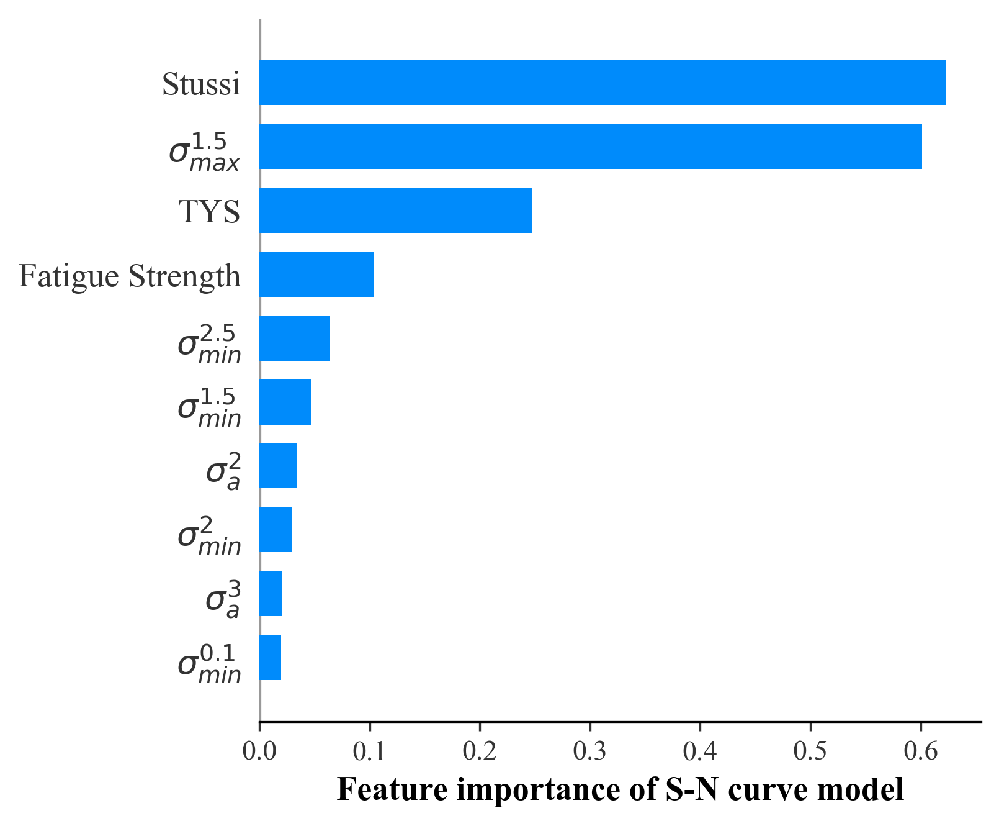

In [65]:
plt.figure(figsize=(5, 10),dpi=300)
shap.summary_plot(shap_values, X, plot_type="bar",show=False)
fig = plt.gcf()
fig.set_size_inches(5,5)
plt.xlabel(f"Feature importance of {model_name} model" , fontweight='bold')
plt.savefig(f'./SN_feature_importance_{model_name}.png')
plt.show()

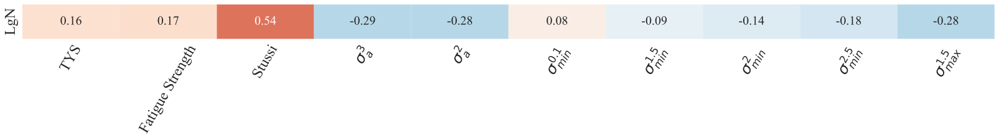

In [32]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
cor = df_curve.corr()
#mask = np.zeros_like(cor["LgN"]).reshape(1,28)
with sns.axes_style("white"):
    plt.rc('font',family='Times New Roman',size=24)
    #plt.figure(figsize=(10, 10), dpi=1000)
    f, ax = plt.subplots(figsize=(28,1))
    ax = sns.heatmap(cor.loc[["LgN"],best_features], annot=True,annot_kws={"size": 20},fmt=".2f",
                     cmap=plt.cm.RdBu_r 
                     #
                     ,cbar=False,
                     linewidths=0,vmin=-1,vmax=1#,mask=mask
                    )
    plt.xticks(rotation=60)
    plt.savefig("corr.png",dpi=600,bbox_inches="tight")


## PCC of featurs

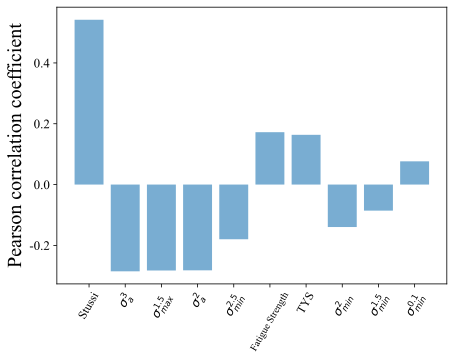

In [33]:
features = best_features
%matplotlib inline
plt.rc('font',family='Times New Roman')
bar_x = features
bar_y = cor.loc["LgN",features].values
bar_x_sorted = np.array(features)[np.argsort(abs(bar_y))][::-1]
bar_y_sorted = np.array(bar_y)[np.argsort(abs(bar_y))][::-1]
fig, ax = plt.subplots(figsize=(7,5),dpi=300)
ax.bar(bar_x_sorted,bar_y_sorted,alpha=0.6,data=True)
ax.set_ylabel("Pearson correlation coefficient",fontsize=20)
#ax.set_yticklabels(fontsize=15) 
ax.tick_params(axis='y', labelsize=13)
#ax.set_ytick(fontsize=15)
#ax.set_xtick(fontsize=12)
for size in ax.get_xticklabels():   #获取x轴上所有坐标，并设置字号
    #print(str(size))
    size.set_fontname('Times New Roman')
i = 0
for tick in ax.get_xticklabels():
    tick.set_rotation(60)
    tick.set_fontsize('12')
    i=i+1
    if i ==6:
        tick.set_fontsize('10')
        #tick.set_fontweight("bold")

plt.savefig("corr_bar.png",dpi=600,bbox_inches="tight")
plt.show()

## model insight

### shap dependent plot

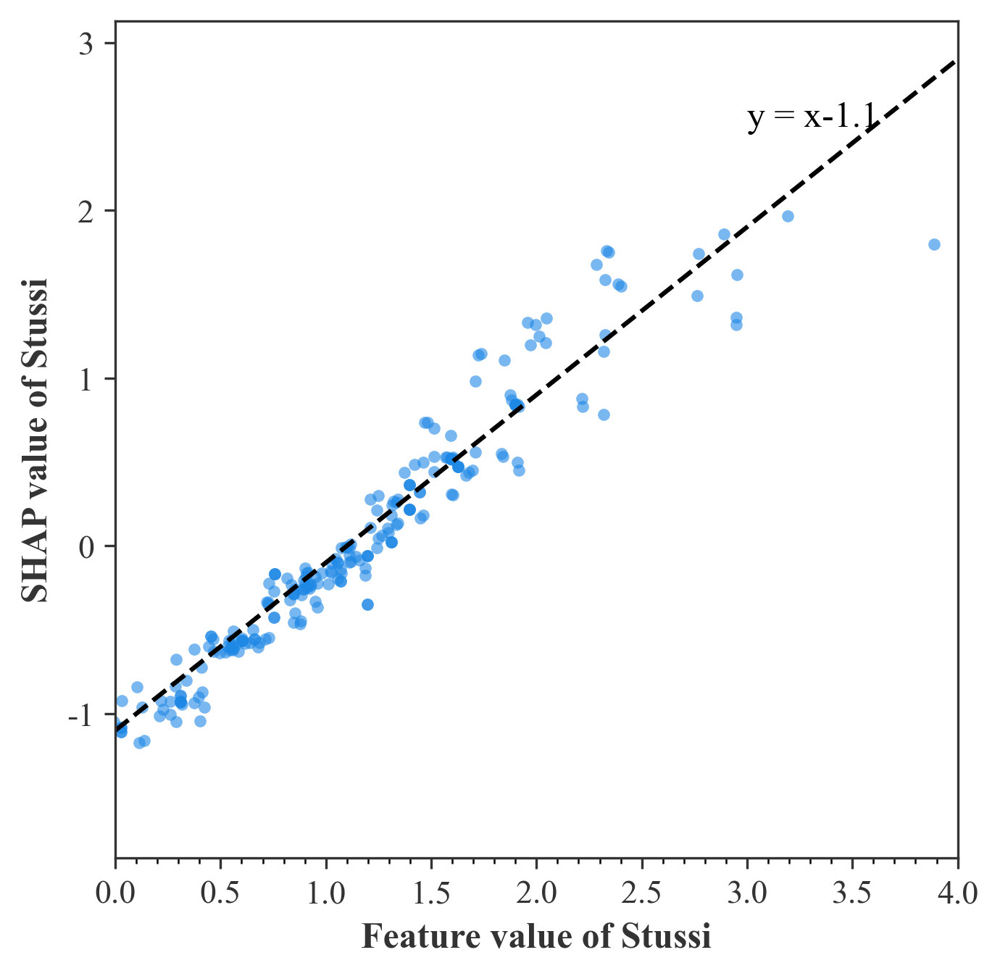

In [164]:
import shap
font1 = {'weight': 'bold',
         'size': 12}
plt.rc('font',family='Times New Roman',size=12)
fig,ax = plt.subplots(dpi=300,figsize=(5,5))
ax.plot([0,4],[-1.1,2.9],"k--")
ax.annotate('y = x-1.1', xy=(2,1), xytext=(3,2.5))
shap.dependence_plot("Stussi", shap_values, X,interaction_index=None,xmin=0,xmax=4,ax=ax,show=False,alpha=0.6)
ax.set_xlabel("Feature value of Stussi",font1)
ax.set_ylabel("SHAP value of Stussi",font1)
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)

plt.savefig("pdp_Stussi.png",dpi=600,bbox_inches="tight")
plt.show()

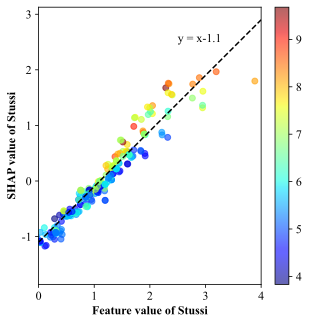

In [41]:
fig,ax = plt.subplots(dpi=400,figsize=(5,5))
c = Y.values
#plt.figure(figsize=(8, 5), dpi=120)
#plt.scatter(data[:, 0], data[:, 1], )
#
plt.scatter(X[best_features[2]],shap_values[:,2],c=c, marker='o', cmap='jet',alpha=0.6)
ax.plot([0,4],[-1.1,2.9],"k--")
ax.annotate('y = x-1.1', xy=(2,1), xytext=(2.5,2.5))
# ax.plot([0,14000],[1,-2.2],"k--")
# k = round(3.2/14000,5)
#ax.annotate(f'y = -{k}x-1.1', xy=(2,1), xytext=(3,1.1))
ax.set_xlabel("Feature value of Stussi",font1)
ax.set_ylabel("SHAP value of Stussi",font1)
ax.set_xlim(0,4)
plt.colorbar()
plt.savefig("pdp_Stussi.png",dpi=600,bbox_inches="tight")
plt.show()

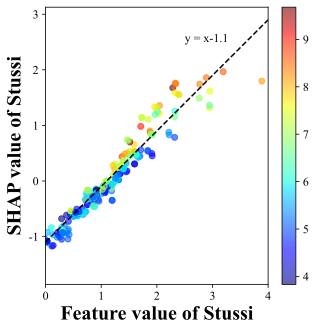

In [42]:
# bigger font 
fig,ax = plt.subplots(dpi=400,figsize=(5,5))
c = Y.values
font_b = {'weight': 'bold',
         'size': 20}
plt.scatter(X[best_features[2]],shap_values[:,2],c=c, marker='o', cmap='jet',alpha=0.6)
ax.plot([0,4],[-1.1,2.9],"k--")
ax.annotate('y = x-1.1', xy=(2,1), xytext=(2.5,2.5))
ax.set_xlabel("Feature value of Stussi",font_b)
ax.set_ylabel("SHAP value of Stussi",font_b)
ax.set_xlim(0,4)
plt.colorbar()
plt.savefig("pdp_Stussi_bigger.png",dpi=600,bbox_inches="tight")
plt.show()

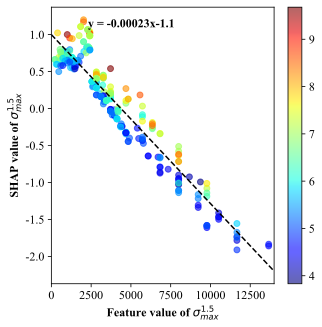

In [43]:
fig,ax = plt.subplots(dpi=400,figsize=(5,5))
c = Y.values

plt.scatter(X[best_features[9]],shap_values[:,9],c=c, marker='o', cmap='jet',alpha=0.6)
ax.plot([0,14000],[1,-2.2],"k--")
k = round(3.2/14000,5)
ax.annotate(f'y = -{k}x-1.1', xy=(2,1), xytext=(2300,1.1),weight = "bold")
ax.set_xlabel("Feature value of $σ_{max}^{1.5}$",font1)
ax.set_ylabel("SHAP value of $σ_{max}^{1.5}$",font1)
ax.set_xlim(0,14000)
plt.colorbar()
plt.savefig("pdp_σ_{max}.png",dpi=600,bbox_inches="tight")
plt.show()


In [49]:
best_features

['TYS',
 'Fatigue Strength',
 'Stussi',
 '$σ_{a}^3$',
 '$σ_{a}^2$',
 '$σ_{min}^{0.1}$',
 '$σ_{min}^{1.5}$',
 '$σ_{min}^2$',
 '$σ_{min}^{2.5}$',
 '$σ_{max}^{1.5}$']

0


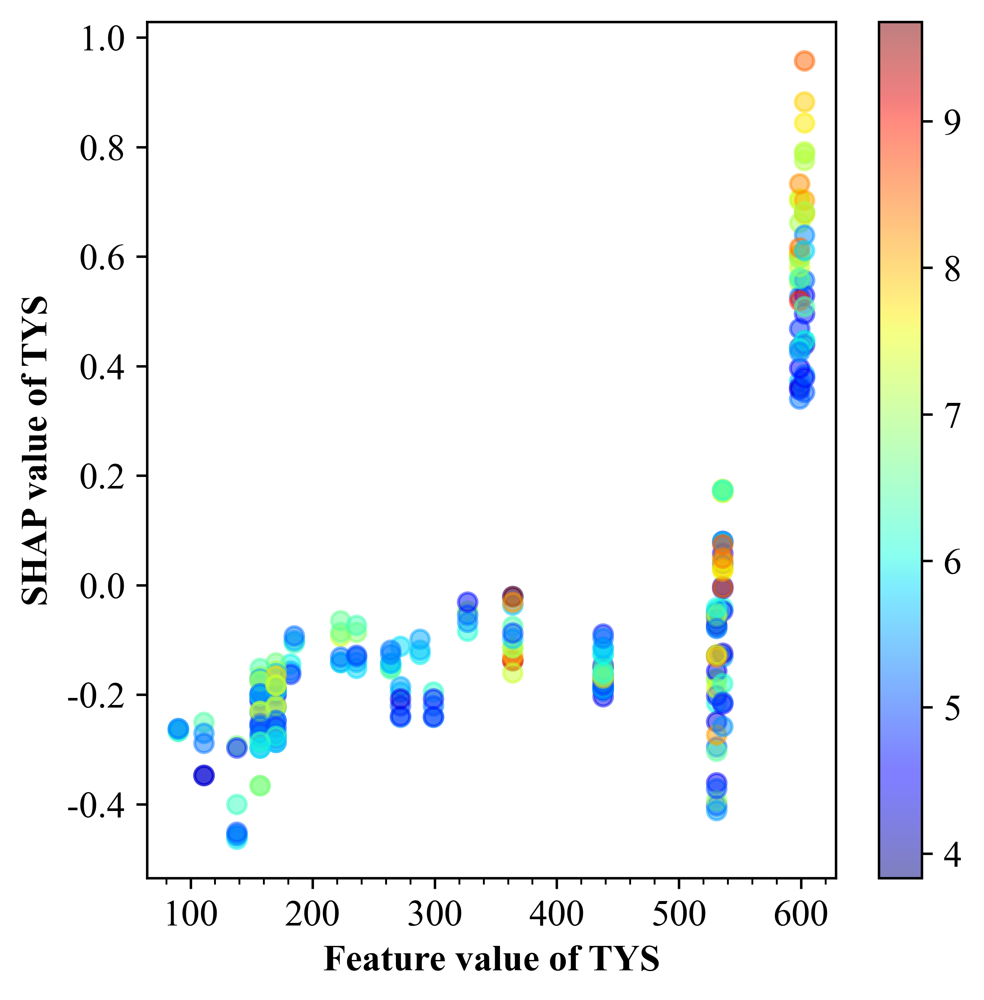

In [169]:
feature_name = "TYS"
f_index = best_features.index(feature_name)
print(f_index)
fig,ax = plt.subplots(dpi=600, figsize=(5,5))
c = Y.values

plt.scatter(X[best_features[f_index]],shap_values[:,f_index],c=c, marker='o', cmap='jet', alpha=0.5)
ax.set_xlabel(f"Feature value of {feature_name}",font1)
ax.set_ylabel(f"SHAP value of {feature_name}",font1)
plt.colorbar()
plt.savefig(f"pdp_{feature_name}.png", dpi=300,bbox_inches="tight")
plt.show()

0


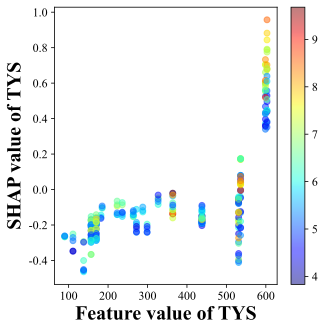

In [61]:
feature_name = "TYS"
f_index = best_features.index(feature_name)
print(f_index)
fig,ax = plt.subplots(dpi=400, figsize=(5,5))
c = Y.values

plt.scatter(X[best_features[f_index]],shap_values[:,f_index],c=c, marker='o', cmap='jet', alpha=0.5)
ax.set_xlabel(f"Feature value of {feature_name}",font_b)
ax.set_ylabel(f"SHAP value of {feature_name}",font_b)
plt.colorbar()
plt.savefig(f"pdp_{feature_name}.png",dpi=600,bbox_inches="tight")
plt.show()

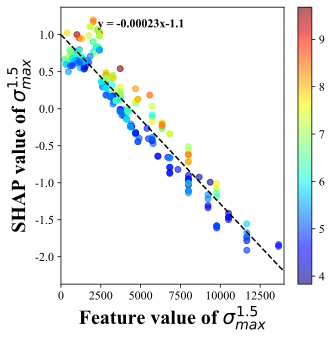

In [44]:
fig,ax = plt.subplots(dpi=400,figsize=(5,5))
c = Y.values

plt.scatter(X[best_features[9]],shap_values[:,9],c=c, marker='o', cmap='jet',alpha=0.6)
ax.plot([0,14000],[1,-2.2],"k--")
k = round(3.2/14000,5)
ax.annotate(f'y = -{k}x-1.1', xy=(2,1), xytext=(2300,1.1),weight = "bold")
ax.set_xlabel("Feature value of $σ_{max}^{1.5}$",font_b)
ax.set_ylabel("SHAP value of $σ_{max}^{1.5}$",font_b)
ax.set_xlim(0,14000)
plt.colorbar()
plt.savefig("pdp_σ_{max}_b.png",dpi=600,bbox_inches="tight")
plt.show()

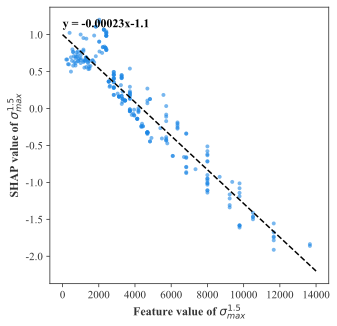

In [45]:
fig,ax = plt.subplots(dpi=300,figsize=(5,5))
#ax.set_xlabel("feature value of TYS")
ax.plot([0,14000],[1,-2.2],"k--")
k = round(3.2/14000,5)
ax.annotate(f'y = -{k}x-1.1', xy=(2,1), xytext=(3,1.1),weight = "bold")
shap.dependence_plot("$σ_{max}^{1.5}$", shap_values, X,interaction_index=None,ax=ax,show=False,alpha=0.6)
ax.set_xlabel("Feature value of $σ_{max}^{1.5}$",font1)
ax.set_ylabel("SHAP value of $σ_{max}^{1.5}$",font1)
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
plt.savefig("pdp_σ_{max}.png",dpi=600,bbox_inches="tight")
plt.show()

In [ ]:
fig,ax = plt.subplots(dpi=300,figsize=(5,5))
#ax.set_xlabel("feature value of TYS")
ax.plot([0,14000],[1,-2.2],"k--")
k = round(3.2/14000,5)
ax.annotate(f'y = -{k}x-1.1', xy=(2,1), xytext=(3,1.1),weight = "bold")
shap.dependence_plot("$σ_{max}^{1.5}$", shap_values, X,interaction_index=None,ax=ax,show=False,alpha=0.6)
ax.set_xlabel("Feature value of $σ_{max}^{1.5}$",font1)
ax.set_ylabel("SHAP value of $σ_{max}^{1.5}$",font1)
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
plt.savefig("pdp_σ_{max}.png",dpi=600,bbox_inches="tight")
plt.show()

### partial dependent plot

In [83]:
def feature_generation(df_curve):
    """
    generate features from source dataset
    """
    df_curve["LogS"]=df_curve["S"].apply(np.log10)
    df_curve["Stussi"] = (df_curve["UTS"]-df_curve["S"])/(df_curve["S"]-df_curve["Fatigue Strength"]+100)
    df_curve["Stussi"] = df_curve["Stussi"].apply(np.log)
    # S
    df_curve["$∆σ^3$"]=df_curve["S"]*df_curve["S"]*df_curve["S"]
    df_curve["$∆σ^2$"]=df_curve["S"]*df_curve["S"]
    df_curve["$∆σ^{0.5}$"]=df_curve["S"].apply(np.sqrt)
    #df_curve["$∆σ^{0.3}$"]=df_curve["S"].apply(lambda x: np.power(x,0.3))
    df_curve["$∆σ^{0.1}$"]=df_curve["S"].apply(lambda x: np.power(x,0.1))


    Smin = "$σ_{min}$"
    Smax = "$σ_{max}$"
    Savg = "$σ_{m}$"
    df_curve[Smax] = 2*df_curve["S"]/(1-df_curve["R"])
    df_curve[Smin] = df_curve[Smax]*df_curve["R"]
    df_curve[Savg] = (np.abs(df_curve[Smin])+np.abs(df_curve[Smax]))/2
    # Smin
    df_curve["$σ_{min}^{0.1}$"]=abs(df_curve[Smin]).apply(lambda x: np.power(x,0.1))
    #df_curve["$σ_{min}^{0.3}$"]=abs(df_curve[Smin]).apply(lambda x: np.power(x,0.3))
    df_curve["$σ_{min}^{0.5}$"]=abs(df_curve[Smin]).apply(np.sqrt)
    df_curve["$σ_{min}^{1.5}$"]=abs(df_curve[Smin]).apply(lambda x: np.power(x,1.5))
    df_curve["$σ_{min}^2$"]=df_curve[Smin].apply(lambda x: np.power(x,2))
    df_curve["$σ_{min}^{2.5}$"]=abs(df_curve[Smin]).apply(lambda x: np.power(x,2.5))
    df_curve["$σ_{min}^3$"]=df_curve[Smin].apply(lambda x: np.power(x,3))

    df_curve["$σ_{max}^{0.1}$"]=abs(df_curve[Smax]).apply(lambda x: np.power(x,0.1))
    #df_curve["$σ_{max}^{0.3}$"]=abs(df_curve[Smax]).apply(lambda x: np.power(x,0.3))                                             
    df_curve["$σ_{max}^{0.5}$"]=abs(df_curve[Smax]).apply(np.sqrt)
    df_curve["$σ_{max}^{1.5}$"]=abs(df_curve[Smax]).apply(lambda x: np.power(x,1.5))
    df_curve["$σ_{max}^2$"]=df_curve[Smax]*df_curve[Smax]
    df_curve["$σ_{max}^{2.5}$"]=abs(df_curve[Smax]).apply(lambda x: np.power(x,2.5))
    df_curve["$σ_{max}^3$"]=df_curve[Smax]*df_curve[Smax]*df_curve[Smax]
    return df_curve
    

#### R

In [103]:
#list_R = sorted(list(df_curve["R"].unique()))
list_R = sorted(list([-2.0,-1.0,0.1,0.5]))
list_R
# 生成笛卡尔积
df_sencity = df_all[coulumns].groupby(["S-N_index","UTS","TYS","R","S","Fatigue Strength"],as_index=False).mean()
df1 = df_sencity[df_sencity["S-N_index"]==21][["S-N_index","UTS","TYS","S","Fatigue Strength"]]
#df1 = df_sencity[["S-N_index","UTS","TYS","S","Fatigue Strength"]]
df2 = pd.DataFrame({"R":list_R})
def product_df(df1,df2):
    df1["key"]=1
    df2["key"]=1
    df_merged = pd.merge(df1,df2,on='key')
    del df_merged["key"]
    return df_merged
df_merged = product_df(df1,df2)
df_merged.head()

,S-N_index,UTS,TYS,S,Fatigue Strength,R
0,21,600,531,200.0,194.805503,-2.0
1,21,600,531,200.0,194.805503,-1.0
2,21,600,531,200.0,194.805503,0.1
3,21,600,531,200.0,194.805503,0.5
4,21,600,531,220.0,194.805503,-2.0


In [104]:
virtual_data = feature_generation(df_merged)[features]
virtual_data["predict"] = model.predict(virtual_data.values)
virtual_data["R"] = df_merged["R"]
virtual_data["S"] = df_merged["S"]
virtual_data.head()

,TYS,Fatigue Strength,Stussi,$∆σ^3$,$∆σ^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$,predict,R,S
0,531,194.805503,1.335654,8000000.0,40000.0,1.748223,4354.648432,71111.111111,1.161240e+06,1539.600718,7.829023,-2.0,200.0
1,531,194.805503,1.335654,8000000.0,40000.0,1.698646,2828.427125,40000.000000,5.656854e+05,2828.427125,7.041921,-1.0,200.0
2,531,194.805503,1.335654,8000000.0,40000.0,1.461443,296.296296,1975.308642,1.316872e+04,9369.711586,4.450647,0.1,200.0
3,531,194.805503,1.335654,8000000.0,40000.0,1.820564,8000.000000,160000.000000,3.200000e+06,22627.416998,4.533893,0.5,200.0
4,531,194.805503,1.110303,10648000.0,48400.0,1.764965,5023.913186,86044.444444,1.473681e+06,1776.221541,7.521048,-2.0,220.0


In [105]:
df_plot = virtual_data.groupby(["S","R"],as_index=False).mean()
df_plot.head()

,S,R,TYS,Fatigue Strength,Stussi,$∆σ^3$,$∆σ^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$,predict
0,200.0,-2.0,531,194.805503,1.335654,8000000.0,40000.0,1.748223,4354.648432,71111.111111,1.161240e+06,1539.600718,7.829023
1,200.0,-1.0,531,194.805503,1.335654,8000000.0,40000.0,1.698646,2828.427125,40000.000000,5.656854e+05,2828.427125,7.041921
2,200.0,0.1,531,194.805503,1.335654,8000000.0,40000.0,1.461443,296.296296,1975.308642,1.316872e+04,9369.711586,4.450647
3,200.0,0.5,531,194.805503,1.335654,8000000.0,40000.0,1.820564,8000.000000,160000.000000,3.200000e+06,22627.416998,4.533893
4,220.0,-2.0,531,194.805503,1.110303,10648000.0,48400.0,1.764965,5023.913186,86044.444444,1.473681e+06,1776.221541,7.521048


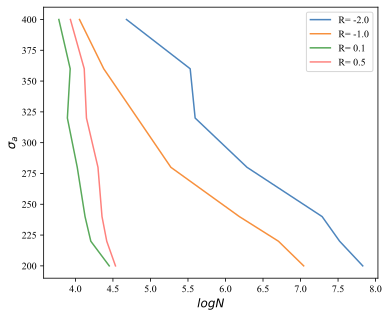

In [106]:
font1 = {'weight': 'bold',
         'size': 12}
fig,ax = plt.subplots(dpi=400,figsize=(6,5))
#color_list = [(23/255,23/255,23/255),"palegoldenrod",'palegreen',"paleturquoise"]
color_list = [(77/255,133/255,189/255),(247/255,144/255,61/255),(89/255,169/255,90/255),(254/255,129/255,125/255)]
i= 0
for R in list_R:
    plt.plot(df_plot[df_plot.R==R]["predict"],df_plot[df_plot.R==R]["S"]
             ,label="R= "+str(R),c=color_list[i],alpha=1)
    i=i+1
ax.set_xlabel("$logN$",font1)
ax.set_ylabel("$σ_a$",font1)
plt.legend()
plt.savefig(f'./R_DP.svg', format='svg')
plt.show()

#### UTS

In [96]:
list_UTS = sorted(list([500,600,700,800]))
print(list_UTS)

df_sencity = df_all[coulumns].groupby(["S-N_index","UTS","TYS","R","S","Fatigue Strength"],as_index=False).mean()
df1 = df_sencity[df_sencity["S-N_index"]==21][["S-N_index","TYS","R","S","Fatigue Strength"]]
df2 = pd.DataFrame({"UTS":list_UTS})
def product_df(df1,df2):
    df1["key"]=1
    df2["key"]=1
    df_merged = pd.merge(df1,df2,on='key')
    del df_merged["key"]
    return df_merged
df_merged = product_df(df1,df2)
df_merged.head()

[500, 600, 700, 800]


,S-N_index,TYS,R,S,Fatigue Strength,UTS
0,21,531,-1.0,200.0,194.805503,500
1,21,531,-1.0,200.0,194.805503,600
2,21,531,-1.0,200.0,194.805503,700
3,21,531,-1.0,200.0,194.805503,800
4,21,531,-1.0,220.0,194.805503,500


In [97]:
virtual_data = feature_generation(df_merged)[features]
virtual_data["predict"] = model.predict(virtual_data.values)
virtual_data["UTS"] = df_merged["UTS"]
virtual_data["S"] = df_merged["S"]
virtual_data.head()

,TYS,Fatigue Strength,Stussi,$∆σ^3$,$∆σ^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$,predict,UTS,S
0,531,194.805503,1.047971,8000000.0,40000.0,1.698646,2828.427125,40000.0,565685.424949,2828.427125,6.640785,500,200.0
1,531,194.805503,1.335654,8000000.0,40000.0,1.698646,2828.427125,40000.0,565685.424949,2828.427125,7.041921,600,200.0
2,531,194.805503,1.558797,8000000.0,40000.0,1.698646,2828.427125,40000.0,565685.424949,2828.427125,7.309221,700,200.0
3,531,194.805503,1.741119,8000000.0,40000.0,1.698646,2828.427125,40000.0,565685.424949,2828.427125,7.871067,800,200.0
4,531,194.805503,0.804921,10648000.0,48400.0,1.714914,3263.127334,48400.0,717888.013551,3263.127334,6.442079,500,220.0


In [98]:
df_plot = virtual_data.groupby(["S","UTS"],as_index=False).mean()
df_plot.head()

,S,UTS,TYS,Fatigue Strength,Stussi,$∆σ^3$,$∆σ^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$,predict
0,200.0,500,531,194.805503,1.047971,8000000.0,40000.0,1.698646,2828.427125,40000.0,565685.424949,2828.427125,6.640785
1,200.0,600,531,194.805503,1.335654,8000000.0,40000.0,1.698646,2828.427125,40000.0,565685.424949,2828.427125,7.041921
2,200.0,700,531,194.805503,1.558797,8000000.0,40000.0,1.698646,2828.427125,40000.0,565685.424949,2828.427125,7.309221
3,200.0,800,531,194.805503,1.741119,8000000.0,40000.0,1.698646,2828.427125,40000.0,565685.424949,2828.427125,7.871067
4,220.0,500,531,194.805503,0.804921,10648000.0,48400.0,1.714914,3263.127334,48400.0,717888.013551,3263.127334,6.442079


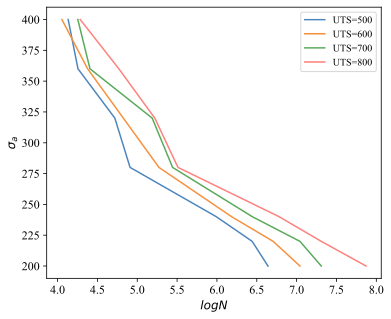

In [102]:
# plot
fig,ax = plt.subplots(dpi=400,figsize=(6,5))
color_list = [(77/255,133/255,189/255),(247/255,144/255,61/255),(89/255,169/255,90/255),(254/255,129/255,125/255)]
i= 0
for UTS in list_UTS:
    plt.plot(df_plot[df_plot.UTS==UTS]["predict"],df_plot[df_plot.UTS==UTS]["S"]
             ,label="UTS="+str(UTS),c=color_list[i])
    i=i+1
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
ax.set_xlabel("$logN$",font1)
ax.set_ylabel("$σ_a$",font1)
plt.legend()
plt.savefig(f'./UTS_DP.svg', format='svg')
plt.show()

# baseline model

In [73]:
baseline_features = ["UTS","TYS","R","$σ_{a}$","$Logσ_{a}$","$σ_{min}$","$σ_{max}$"]

['UTS', 'TYS', 'R', '$σ_{a}$', '$Logσ_{a}$', '$σ_{min}$', '$σ_{max}$']
MRE： 3.108961992846086
样本个数  257
均方根误差RMSE  0.599
均方差MSE  0.359
平均绝对误差MAE  0.446
R2： 0.742


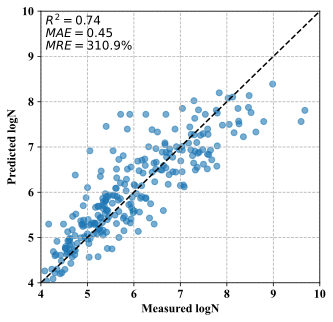

In [74]:
# setting
model_name = "baseline"
features = baseline_features

plt.rc('font',family='Times New Roman',size=12)
from sklearn.model_selection import LeaveOneGroupOut
logo = LeaveOneGroupOut()
y_predict_list = []
y_true_list = []
index_list = []

x = df_curve[features].values
#x = df_curve[X_columns].values
print(features)
for train_index, test_index in logo.split(x, Y, groups_array):# 根据合金的名称将其分组
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x[train_index], x[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    
    model = GradientBoostingRegressor(random_state=0)
    model.fit(X_train,Y_train)
    
    y_predict_list.extend(model.predict(X_test))
    y_true_list.extend(Y_test)
    index_list.extend(index[test_index])
# calculate mre
mre = mean_relative_error(np.power(10,y_true_list), np.power(10,y_predict_list))
print("MRE：",mre)

evalucation_matrix = evaluate_model_plot(y_true_list,y_predict_list,show=False)

# true
y_true = y_true_list
y_predict = y_predict_list
plt.figure(figsize=(5, 5), dpi=400)
plt.rcParams['font.sans-serif'] = ['Arial']  # 设置字体
plt.rcParams['axes.unicode_minus'] = False  # 显示负号
plt.grid(linestyle="--")  # 设置背景网格线为虚线
ax = plt.gca()  # 获取坐标轴对象
plt.scatter(y_true, y_predict,alpha=0.6)
plt.plot([4, 10], [4, 10], color='black',linestyle="--")

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel("Measured logN", fontsize=12, fontweight='bold')
plt.ylabel("Predicted logN", fontsize=12, fontweight='bold')
plt.xlim(4, 10)  # 设置x轴的范围
plt.ylim(4, 10)
plt.text(4.1,9.15,"$R^2={r2}$\n$MAE={MAE}$\n$MRE={MRE}\%$".format(r2=round(evalucation_matrix["R2"],2)
                                                                ,MAE=round(evalucation_matrix["MAE"],2)
                                                                ,MRE=round(mre*100,1)
                                                              ))
# 
plt.savefig(f'./sn_evaluation_{model_name}.svg', format='svg')
plt.show()

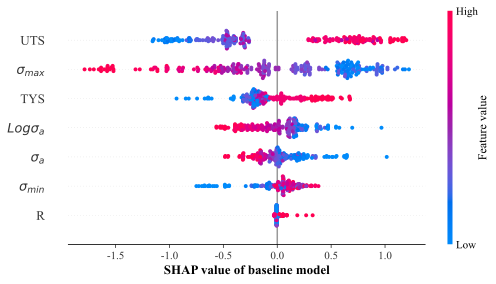

In [75]:
import shap
X = df_curve[features]
explainer = shap.TreeExplainer(model,feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(X)
#
plt.figure(figsize=(5, 10),dpi=300)         
shap.summary_plot(shap_values, X,show=False)
plt.xlabel(f"SHAP value of {model_name} model" , fontweight='bold')

plt.savefig(f'./SN_shap_{model_name}.png')
plt.show()

NameError: name 'model_name' is not defined

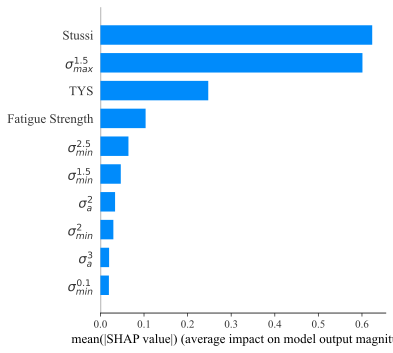

In [46]:
plt.figure(figsize=(5, 10),dpi=300)
shap.summary_plot(shap_values, X, plot_type="bar",show=False)
fig = plt.gcf()
fig.set_size_inches(5,5)
plt.xlabel(f"Feature importance of {model_name} model" , fontweight='bold')
plt.savefig(f'./SN_feature_importance_{model_name}.png')
plt.show()

# guesswork feature 

In [35]:
guessing_features = ["UTS","TYS","R","$σ_{a}$","$Logσ_{a}$","$σ_{min}$","$σ_{max}$",'$σ_{a}^3$', '$σ_{a}^2$', '$σ_{a}^{0.5}$', '$σ_{a}^{0.1}$',
      '$σ_{m}$', '$σ_{min}^{0.1}$', '$σ_{min}^{0.5}$',
       '$σ_{min}^{1.5}$', '$σ_{min}^2$', '$σ_{min}^{2.5}$', '$σ_{min}^3$',
       '$σ_{max}^{0.1}$', '$σ_{max}^{0.5}$', '$σ_{max}^{1.5}$', '$σ_{max}^2$',
       '$σ_{max}^{2.5}$', '$σ_{max}^3$']

In [34]:
df_curve.columns

Index(['S-N_index', 'UTS', 'TYS', 'R', '$σ_{a}$', 'Fatigue Strength', 'LgN',
       '$Logσ_{a}$', 'Stussi', '$σ_{a}^3$', '$σ_{a}^2$', '$σ_{a}^{0.5}$',
       '$σ_{a}^{0.1}$', '$σ_{max}$', '$σ_{min}$', '$σ_{m}$', '$σ_{min}^{0.1}$',
       '$σ_{min}^{0.5}$', '$σ_{min}^{1.5}$', '$σ_{min}^2$', '$σ_{min}^{2.5}$',
       '$σ_{min}^3$', '$σ_{max}^{0.1}$', '$σ_{max}^{0.5}$', '$σ_{max}^{1.5}$',
       '$σ_{max}^2$', '$σ_{max}^{2.5}$', '$σ_{max}^3$'],
      dtype='object')

['UTS', 'TYS', 'R', '$σ_{a}$', '$Logσ_{a}$', '$σ_{min}$', '$σ_{max}$', '$σ_{a}^3$', '$σ_{a}^2$', '$σ_{a}^{0.5}$', '$σ_{a}^{0.1}$', '$σ_{m}$', '$σ_{min}^{0.1}$', '$σ_{min}^{0.5}$', '$σ_{min}^{1.5}$', '$σ_{min}^2$', '$σ_{min}^{2.5}$', '$σ_{min}^3$', '$σ_{max}^{0.1}$', '$σ_{max}^{0.5}$', '$σ_{max}^{1.5}$', '$σ_{max}^2$', '$σ_{max}^{2.5}$', '$σ_{max}^3$']
MRE： 2.188567535276678
样本个数  257
均方根误差RMSE  0.573
均方差MSE  0.329
平均绝对误差MAE  0.43
R2： 0.763


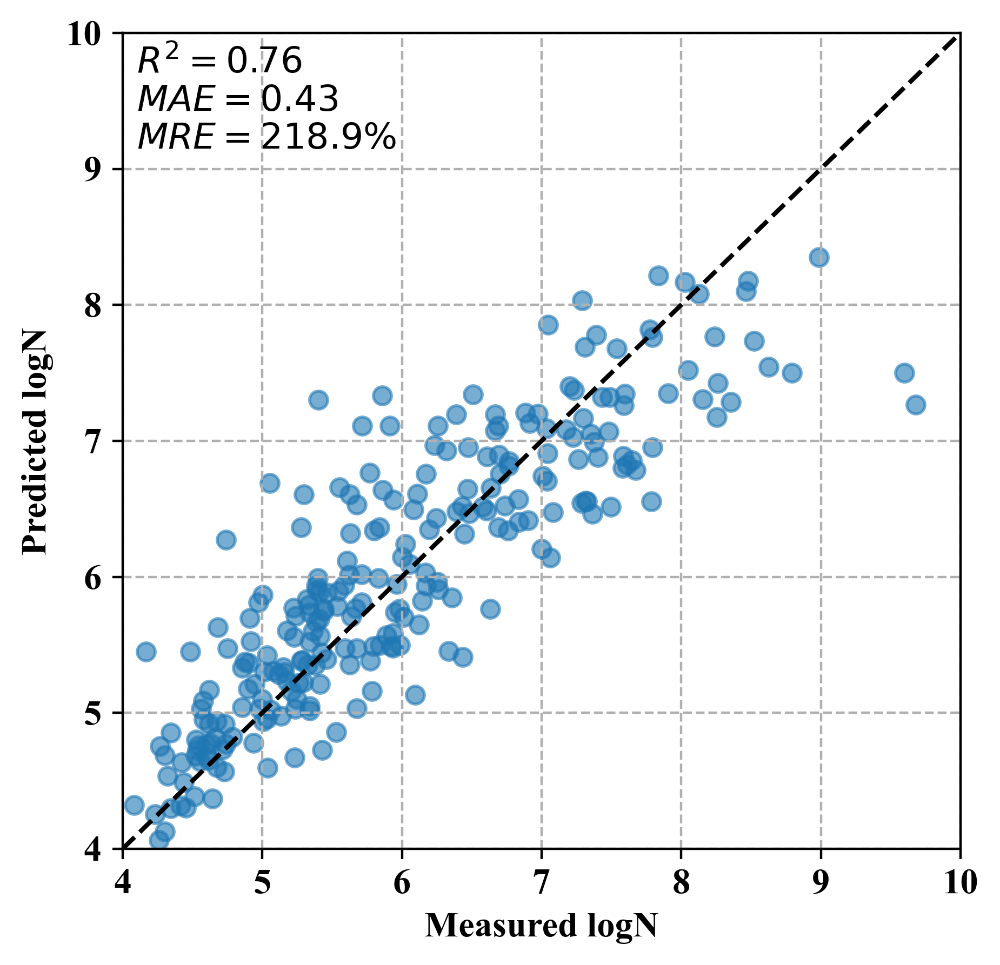

In [36]:
# setting
model_name = "guessing"
features = guessing_features

plt.rc('font',family='Times New Roman',size=12)
from sklearn.model_selection import LeaveOneGroupOut
logo = LeaveOneGroupOut()
y_predict_list = []
y_true_list = []
index_list = []

x = df_curve[features].values
print(features)
for train_index, test_index in logo.split(x, Y, groups_array):# 根据合金的名称将其分组
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x[train_index], x[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    
    model = GradientBoostingRegressor(random_state=0)
    model.fit(X_train,Y_train)
    
    y_predict_list.extend(model.predict(X_test))
    y_true_list.extend(Y_test)
    index_list.extend(index[test_index])
# calculate mre
mre = mean_relative_error(np.power(10,y_true_list), np.power(10,y_predict_list))
print("MRE：",mre)

evalucation_matrix = evaluate_model_plot(y_true_list,y_predict_list,show=False)

# true
y_true = y_true_list
y_predict = y_predict_list
plt.figure(figsize=(5, 5), dpi=400)
plt.rcParams['font.sans-serif'] = ['Arial']  # 设置字体
plt.rcParams['axes.unicode_minus'] = False  # 显示负号
plt.grid(linestyle="--")  # 设置背景网格线为虚线
ax = plt.gca()  # 获取坐标轴对象
plt.scatter(y_true, y_predict,alpha=0.6)
plt.plot([4, 10], [4, 10], color='black',linestyle="--")

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel("Measured logN", fontsize=12, fontweight='bold')
plt.ylabel("Predicted logN", fontsize=12, fontweight='bold')
plt.xlim(4, 10)  # 设置x轴的范围
plt.ylim(4, 10)
plt.text(4.1,9.15,"$R^2={r2}$\n$MAE={MAE}$\n$MRE={MRE}\%$".format(r2=round(evalucation_matrix["R2"],2)
                                                                ,MAE=round(evalucation_matrix["MAE"],2)
                                                                ,MRE=round(mre*100,1)
                                                              ))
# 
plt.savefig(f'./sn_evaluation_{model_name}.svg', format='svg')
plt.show()

# estimation feature 

In [37]:
estimation_features = ["UTS","TYS","R","$σ_{a}$","$Logσ_{a}$","$σ_{min}$","$σ_{max}$","Stussi"]

['UTS', 'TYS', 'R', '$σ_{a}$', '$Logσ_{a}$', '$σ_{min}$', '$σ_{max}$', 'Stussi']
MRE： 1.8703088337799127
样本个数  257
均方根误差RMSE  0.584
均方差MSE  0.341
平均绝对误差MAE  0.431
R2： 0.754


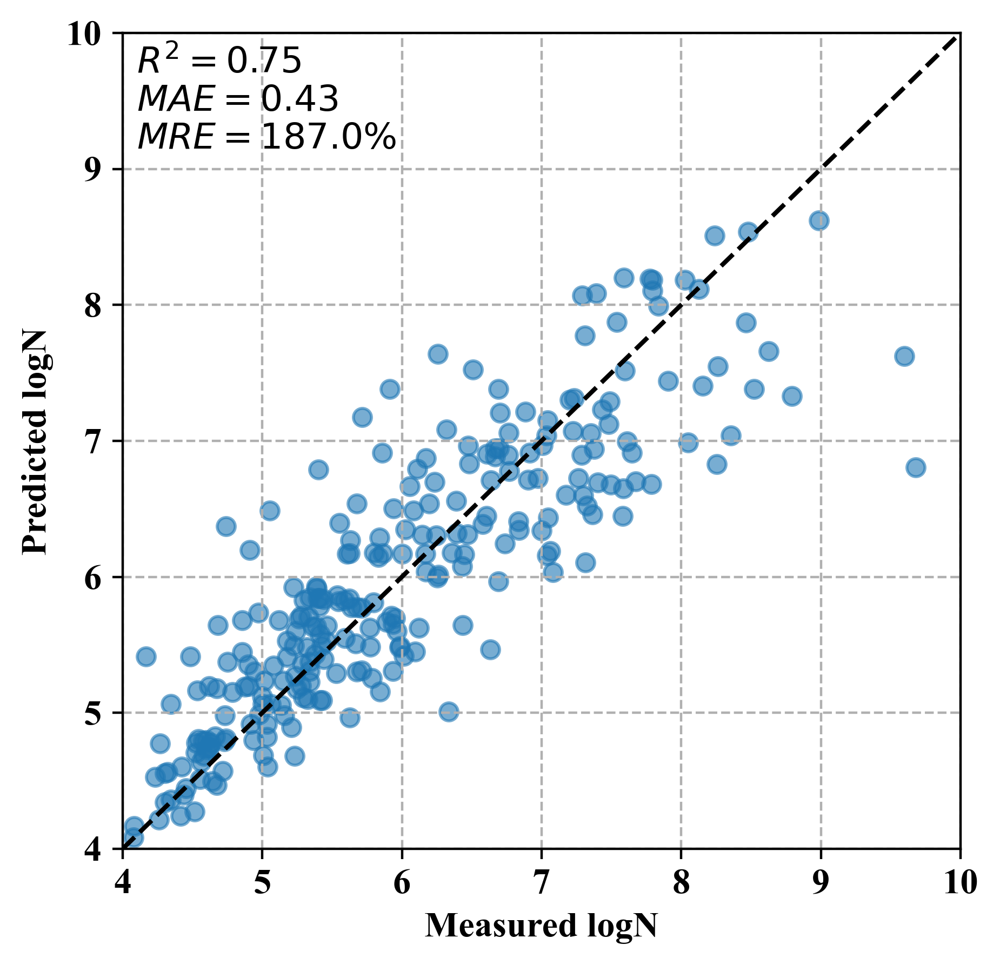

In [38]:
# setting
model_name = "estimation"
features = estimation_features

plt.rc('font',family='Times New Roman',size=12)
from sklearn.model_selection import LeaveOneGroupOut
logo = LeaveOneGroupOut()
y_predict_list = []
y_true_list = []
index_list = []

x = df_curve[features].values
#x = df_curve[X_columns].values
print(features)
for train_index, test_index in logo.split(x, Y, groups_array):# 根据合金的名称将其分组
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x[train_index], x[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]
    
    model = GradientBoostingRegressor(random_state=0)
    model.fit(X_train,Y_train)
    
    y_predict_list.extend(model.predict(X_test))
    y_true_list.extend(Y_test)
    index_list.extend(index[test_index])
# calculate mre
mre = mean_relative_error(np.power(10,y_true_list), np.power(10,y_predict_list))
print("MRE：",mre)

evalucation_matrix = evaluate_model_plot(y_true_list,y_predict_list,show=False)

# true
y_true = y_true_list
y_predict = y_predict_list
plt.figure(figsize=(5, 5), dpi=400)
plt.rcParams['font.sans-serif'] = ['Arial']  # 设置字体
plt.rcParams['axes.unicode_minus'] = False  # 显示负号
plt.grid(linestyle="--")  # 设置背景网格线为虚线
ax = plt.gca()  # 获取坐标轴对象
plt.scatter(y_true, y_predict,alpha=0.6)
plt.plot([4, 10], [4, 10], color='black',linestyle="--")

plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.xlabel("Measured logN", fontsize=12, fontweight='bold')
plt.ylabel("Predicted logN", fontsize=12, fontweight='bold')
plt.xlim(4, 10)  # 设置x轴的范围
plt.ylim(4, 10)
plt.text(4.1,9.15,"$R^2={r2}$\n$MAE={MAE}$\n$MRE={MRE}\%$".format(r2=round(evalucation_matrix["R2"],2)
                                                                ,MAE=round(evalucation_matrix["MAE"],2)
                                                                ,MRE=round(mre*100,1)
                                                              ))
# 
plt.savefig(f'./sn_evaluation_{model_name}.svg', format='svg')
plt.show()

# Figures

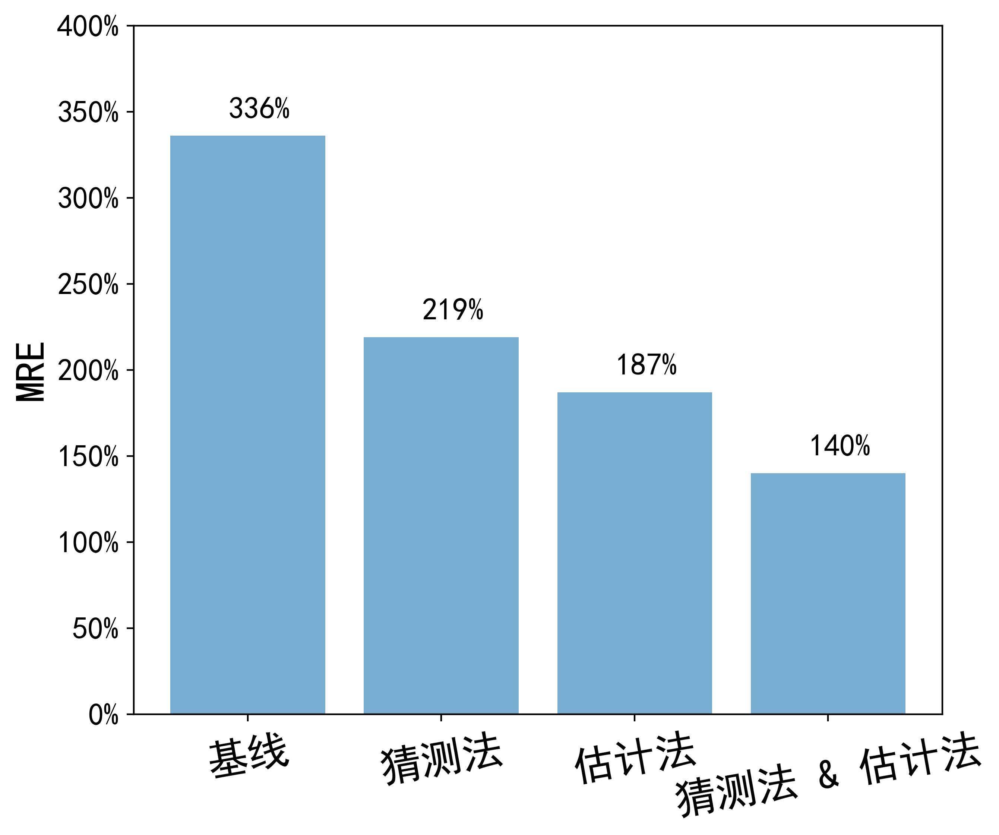

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker
from matplotlib.ticker import PercentFormatter
plt.rcParams['font.sans-serif'] = ['SimHei']  
plt.rcParams['axes.unicode_minus'] = False
x = np.array(["基线", "猜测法", "估计法", "猜测法 & 估计法"])
y = np.array([3.36, 2.19, 1.87, 1.40])

plt.figure(figsize=(7, 6),dpi=400)
ax = plt.gca()
plt.bar(x, y,alpha=0.6)
plt.xticks(fontsize=20) 
plt.yticks(fontsize=15)
plt.ylim(0, 4)
plt.ylabel("MRE",fontsize=20)
plt.gca().yaxis.set_major_formatter(PercentFormatter(xmax=1,decimals=0))

for tick in ax.get_xticklabels():
    tick.set_rotation(10)
plt.text(-0.1,3.46,"336%",fontsize=15)
plt.text(0.9,2.29,"219%",fontsize=15)
plt.text(1.9,1.97,"187%",fontsize=15)
plt.text(2.9,1.5,"140%",fontsize=15)
plt.savefig('./metric_bar.svg', format='svg')  # nkscape
plt.show()

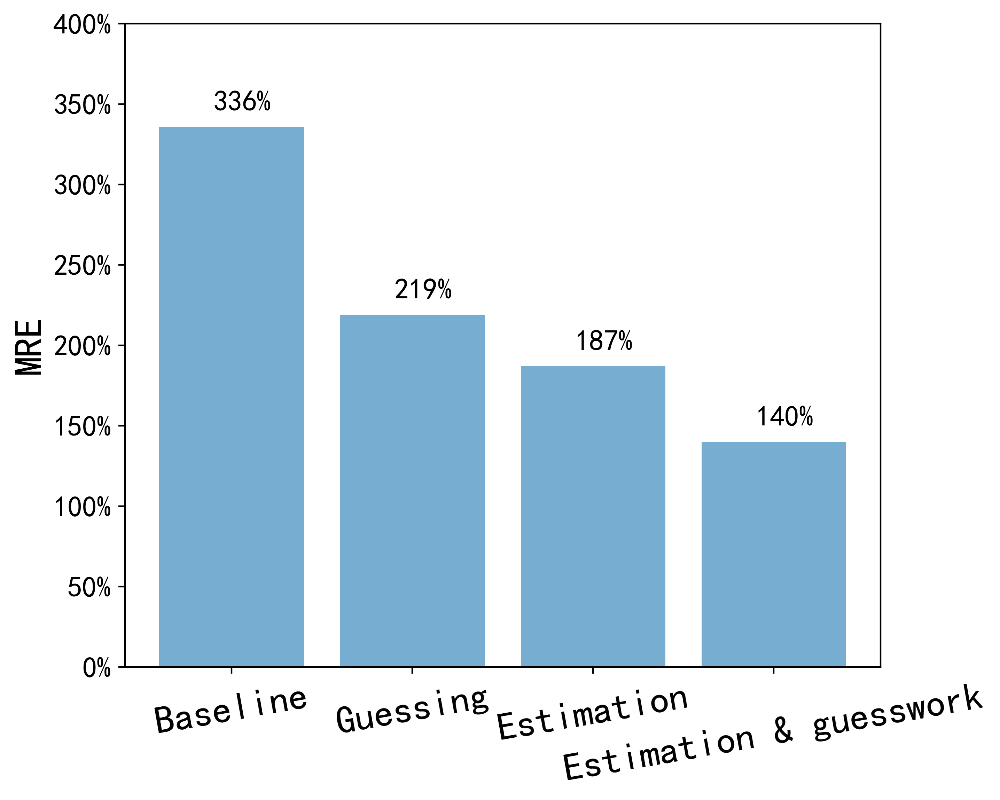

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker
from matplotlib.ticker import PercentFormatter
x = np.array(["Baseline", "Guessing", "Estimation", "Estimation & guesswork"])
y = np.array([3.36, 2.19, 1.87, 1.40])

plt.figure(figsize=(7, 6),dpi=400)
ax = plt.gca()
plt.bar(x, y,alpha=0.6)
plt.xticks(fontsize=20) 
plt.yticks(fontsize=15)
plt.ylim(0, 4)
plt.ylabel("MRE",fontsize=20)
plt.gca().yaxis.set_major_formatter(PercentFormatter(xmax=1,decimals=0))

for tick in ax.get_xticklabels():
    tick.set_rotation(10)
plt.text(-0.1,3.46,"336%",fontsize=15)
plt.text(0.9,2.29,"219%",fontsize=15)
plt.text(1.9,1.97,"187%",fontsize=15)
plt.text(2.9,1.5,"140%",fontsize=15)
plt.savefig('./metric_bar.svg', format='svg')  # nkscape
plt.show()

# prediction for 7050-T651

In [63]:
model = GradientBoostingRegressor(random_state=0)
model.fit(X_train[features],Y_train)
import pickle
with open("Nf_model.pkl", "wb") as f:
    pickle.dump(model,f)

In [64]:
with open("Nf_model.pkl", "rb") as f:
    model = pickle.load(f)

In [111]:
import numpy as np
import pandas as pd
def calculate_max_min_stress(avg_stress=None, stress_ratio=None, stress_amp=None):
    """
    根据任意两个参数（平均应力、应力比、应力幅）计算最大和最小应力
    参数：
        avg_stress (float): 平均应力 (σ_m)
        stress_ratio (float): 应力比 (R = σ_min/σ_max)
        stress_amp (float): 应力幅 (σ_a)
    返回：
        tuple: (最大应力σ_max, 最小应力σ_min)
    异常处理：
        参数冲突或除零错误时抛出ValueError
    """
    # 检测输入参数数量
    provided = [avg_stress, stress_ratio, stress_amp].count(None)
    if provided != 1:
        raise ValueError("必须且只能提供两个参数")

    try:
        # 场景1：已知平均应力和应力比
        if avg_stress is not None and stress_ratio is not None:
            if stress_ratio == -1 and avg_stress != 0:
                raise ValueError("当R=-1时平均应力必须为0")
            sigma_max = (2 * avg_stress) / (1 + stress_ratio)
            sigma_min = stress_ratio * sigma_max

        # 场景2：已知平均应力和应力幅
        elif avg_stress is not None and stress_amp is not None:
            sigma_max = avg_stress + stress_amp
            sigma_min = avg_stress - stress_amp

        # 场景3：已知应力比和应力幅
        elif stress_ratio is not None and stress_amp is not None:
            if stress_ratio == 1:
                raise ValueError("应力比不能为1")
            sigma_max = (2 * stress_amp) / (1 - stress_ratio)
            sigma_min = stress_ratio * sigma_max

        # 验证参数一致性
        if avg_stress is not None and not np.isclose((sigma_max + sigma_min)/2, avg_stress):
            raise ValueError("平均应力参数不匹配")
        if stress_ratio is not None and not np.isclose(sigma_min/sigma_max, stress_ratio):
            raise ValueError("应力比参数不匹配")
        if stress_amp is not None and not np.isclose((sigma_max - sigma_min)/2, stress_amp):
            raise ValueError("应力幅参数不匹配")

        return round(sigma_max, 6), round(sigma_min, 6)
    except ZeroDivisionError:
        raise ValueError("参数组合导致除零错误，请检查输入值")
# test case
print(calculate_max_min_stress(avg_stress=100, stress_ratio=0.5))   # (133.333333, 66.666667)
print(calculate_max_min_stress(stress_ratio=-1, stress_amp=50))    # (50.0, -50.0)
print(calculate_max_min_stress(avg_stress=80, stress_amp=20))       # (100.0, 60.0)

(133.333333, 66.666667)
(50.0, -50.0)
(100, 60)


In [112]:
features="TYS,Fatigue Strength,Stussi,$σ_{a}^3$,$σ_{a}^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$".split(",")
features

['TYS',
 'Fatigue Strength',
 'Stussi',
 '$σ_{a}^3$',
 '$σ_{a}^2$',
 '$σ_{min}^{0.1}$',
 '$σ_{min}^{1.5}$',
 '$σ_{min}^2$',
 '$σ_{min}^{2.5}$',
 '$σ_{max}^{1.5}$']

In [116]:
df = pd.read_excel("./fs_predict.xlsx", sheet_name="S_N_data")
df2 = pd.read_excel("./fs_predict.xlsx", sheet_name="composition")

df = df.dropna()

sigma_maxs = []
sigma_mins = []
for (sigma_a, r) in zip(df["sigma_a"],df["stress_ratio"]):
    sigma_max,sigma_min = calculate_max_min_stress(stress_ratio=r, stress_amp=sigma_a)
    sigma_mean = (sigma_max + sigma_min)/2
    sigma_maxs.append(sigma_max)
    sigma_mins.append(sigma_min)
df['$σ_{max}$'] = sigma_maxs
df['$σ_{min}$'] = sigma_mins
df = pd.merge(df,df2,on="name")
df.tail()

,name,sub-name,N,sigma_a,stress_ratio,$σ_{max}$,$σ_{min}$,Composition,Temper,UTS,TYS
61,7075-T651-CG-SMRT,CG-SMRT,1.510463e+05,287.574731,-1.0,287.574731,-287.574731,1,T651,620,536
62,7075-T651-CG-SMRT,CG-SMRT,2.996420e+05,267.631181,-1.0,267.631181,-267.631181,1,T651,620,536
63,7075-T651-CG-SMRT,CG-SMRT,8.511068e+05,257.935078,-1.0,257.935078,-257.935078,1,T651,620,536
64,7075-T651-CG-SMRT,CG-SMRT,2.947662e+06,222.421869,-1.0,222.421869,-222.421869,1,T651,620,536
65,7075-T651-CG-SMRT,CG-SMRT,7.245940e+07,176.215685,-1.0,176.215685,-176.215685,1,T651,620,536


In [117]:
df['$σ_{a}$'] = df['sigma_a']
FS_predict = 164.18887131
df['Fatigue Strength'] = FS
df["Stussi"] = (df["UTS"]-df['$σ_{a}$'])/(df['$σ_{a}$']-df["Fatigue Strength"]+100)
df["Stussi"] = df["Stussi"].apply(np.log)
df['$σ_{a}^3$'] = abs(df['$σ_{a}$']).apply(lambda x: np.power(x,3)) 
df['$σ_{a}^2$'] = abs(df['$σ_{a}$']).apply(lambda x: np.power(x,2))
df['$σ_{min}^{0.1}$'] = abs(df['$σ_{min}$']).apply(lambda x: np.power(x,0.1))
df['$σ_{min}^{1.5}$'] = abs(df['$σ_{min}$']).apply(lambda x: np.power(x,1.5))
df['$σ_{min}^2$'] = abs(df['$σ_{min}$']).apply(lambda x: np.power(x,2))
df['$σ_{min}^{2.5}$'] =  abs(df['$σ_{min}$']).apply(lambda x: np.power(x,2.5))
df['$σ_{max}^{1.5}$'] =  abs(df['$σ_{max}$']).apply(lambda x: np.power(x,1.5))
df

,name,sub-name,N,sigma_a,stress_ratio,$σ_{max}$,$σ_{min}$,Composition,Temper,UTS,...,$σ_{a}$,Fatigue Strength,Stussi,$σ_{a}^3$,$σ_{a}^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$
0,7075-T651-CG,CG,7.181449e+03,224.903561,0.1,499.785690,49.978569,1,T651,545,...,224.903561,164.188871,0.688992,1.137598e+07,50581.611559,1.478694,353.326105,2497.857359,1.765873e+04,11173.152482
1,7075-T651-CG,CG,1.079578e+04,211.256492,0.1,469.458871,46.945887,1,T651,545,...,211.256492,164.188871,0.819480,9.428231e+06,44629.305421,1.469467,321.659456,2203.916306,1.510059e+04,10171.765163
2,7075-T651-CG,CG,1.406230e+04,202.387255,0.1,449.749455,44.974946,1,T651,545,...,202.387255,164.188871,0.907911,8.289904e+06,40960.600966,1.463178,301.617111,2022.745768,1.356521e+04,9537.970363
3,7075-T651-CG,CG,3.403328e+04,188.998547,0.1,419.996772,41.999677,1,T651,545,...,188.998547,164.188871,1.048145,6.751113e+06,35720.450877,1.453197,272.187969,1763.972868,1.143181e+04,8607.339412
4,7075-T651-CG,CG,7.885251e+04,180.006554,0.1,400.014565,40.001456,1,T651,545,...,180.006554,164.188871,1.147862,5.832637e+06,32402.359569,1.446131,252.996026,1600.116482,1.012021e+04,8000.436954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,7075-T651-CG-SMRT,CG-SMRT,1.510463e+05,287.574731,-1.0,287.574731,-287.574731,1,T651,620,...,287.574731,164.188871,0.397514,2.378221e+07,82699.226051,1.761469,4876.700488,82699.225910,1.402416e+06,4876.700488
62,7075-T651-CG-SMRT,CG-SMRT,2.996420e+05,267.631181,-1.0,267.631181,-267.631181,1,T651,620,...,267.631181,164.188871,0.549296,1.916947e+07,71626.449070,1.748854,4378.295462,71626.449043,1.171768e+06,4378.295462
63,7075-T651-CG-SMRT,CG-SMRT,8.511068e+05,257.935078,-1.0,257.935078,-257.935078,1,T651,620,...,257.935078,164.188871,0.625274,1.716055e+07,66530.504694,1.742413,4142.529524,66530.504463,1.068504e+06,4142.529524
64,7075-T651-CG-SMRT,CG-SMRT,2.947662e+06,222.421869,-1.0,222.421869,-222.421869,1,T651,620,...,222.421869,164.188871,0.921323,1.100354e+07,49471.487811,1.716792,3317.158540,49471.487809,7.378086e+05,3317.158540


In [118]:
df['$logN$'] = model.predict(df[features])
df['N_predict'] = df['$logN$'].apply(lambda x: np.power(10,x)) 
df["S_N_name"] =  df["name"] + "\n R= " + df["stress_ratio"].astype(str)
df.head()

,name,sub-name,N,sigma_a,stress_ratio,$σ_{max}$,$σ_{min}$,Composition,Temper,UTS,...,$σ_{a}^3$,$σ_{a}^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$,$logN$,N_predict,S_N_name
0,7075-T651-CG,CG,7181.448918,224.903561,0.1,499.785690,49.978569,1,T651,545,...,1.137598e+07,50581.611559,1.478694,353.326105,2497.857359,17658.733112,11173.152482,4.375905,23763.197613,7075-T651-CG\n R= 0.1
1,7075-T651-CG,CG,10795.782781,211.256492,0.1,469.458871,46.945887,1,T651,545,...,9.428231e+06,44629.305421,1.469467,321.659456,2203.916306,15100.588491,10171.765163,4.367310,23297.516488,7075-T651-CG\n R= 0.1
2,7075-T651-CG,CG,14062.295761,202.387255,0.1,449.749455,44.974946,1,T651,545,...,8.289904e+06,40960.600966,1.463178,301.617111,2022.745768,13565.213282,9537.970363,4.322007,20989.739672,7075-T651-CG\n R= 0.1
3,7075-T651-CG,CG,34033.283908,188.998547,0.1,419.996772,41.999677,1,T651,545,...,6.751113e+06,35720.450877,1.453197,272.187969,1763.972868,11431.806799,8607.339412,4.413631,25919.732164,7075-T651-CG\n R= 0.1
4,7075-T651-CG,CG,78852.505463,180.006554,0.1,400.014565,40.001456,1,T651,545,...,5.832637e+06,32402.359569,1.446131,252.996026,1600.116482,10120.209393,8000.436954,4.440280,27560.053928,7075-T651-CG\n R= 0.1


In [ ]:
# S_N_name:区别是哪条S-N曲线   N 实际疲劳寿命 N_predict 预测疲劳寿命  $σ_{a}$ 应力幅

In [106]:
df.to_csv("predict.csv", index=False)

<Figure size 640x480 with 0 Axes>

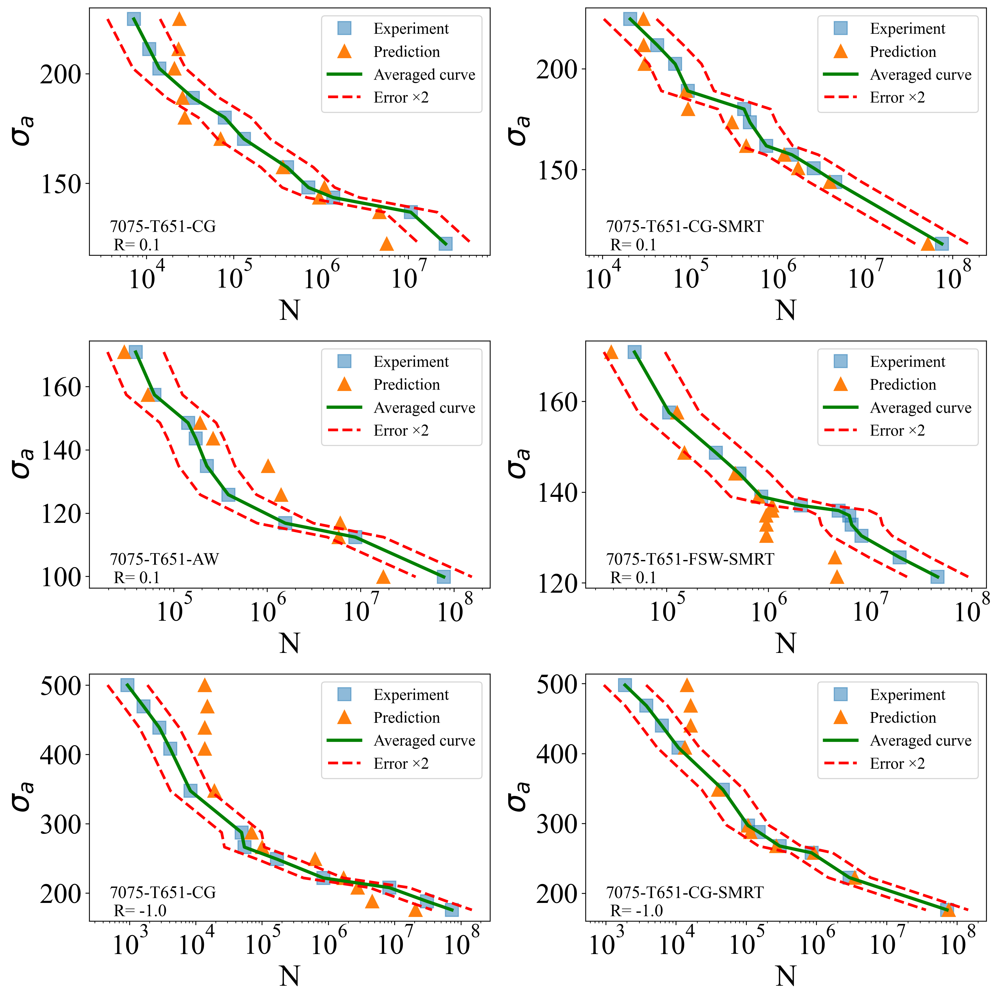

In [188]:
from matplotlib import ticker
from matplotlib.ticker import LogLocator
from matplotlib.ticker import LogLocator, ScalarFormatter
from matplotlib import ticker as mticker
import matplotlib as mpl
mpl.rcParams['xtick.minor.visible'] = True  # 强制显示次刻度
mpl.rcParams['xtick.top'] = False  # 显示顶部刻度
def plot_sn_curves(test_names, df, 
                  row=4, col=2, figsize=(13, 13), dpi=300,
                  axis_fontsize=24, label_fontsize=28, 
                  annotation_fontsize=10, legend_fontsize=20,
                  xlim_dict=None):
    """
    绘制统一格式的S-N曲线对比图
    
    参数：
    test_names -- 需要绘制的曲线名称列表
    df -- 包含以下列的数据框：
          S_N_name: 曲线标识
          N: 实际疲劳寿命 
          N_predict: 预测疲劳寿命
          $σ_{a}$: 应力幅
    row/col -- 子图行列数
    figsize/dpi -- 图像尺寸和分辨率
    fontsize相关 -- 各文字元素字号
    xlim_dict -- 特殊x轴范围设置字典 {曲线名: (min, max)}
    """
    plt.subplots_adjust(hspace=0.5, wspace=0.5)
    fig, axes = plt.subplots(row, col, figsize=figsize, dpi=dpi)
    axes = axes.flatten()

    for i, ax in enumerate(axes):
        ax.tick_params(axis='x', labelsize=axis_fontsize)
        ax.tick_params(axis='y', labelsize=axis_fontsize)
        
        if i < len(test_names):
            current_curve = test_names[i]
            curve_data = df[df["S_N_name"] == current_curve]
            
            # 计算平均曲线（几何均值）
            avg_curve = curve_data.groupby("$σ_{a}$")["N"].agg(lambda x: x.mean()).reset_index().sort_values("$σ_{a}$", ascending=False)
            
            # 绘制实验数据点
            ax.semilogx(curve_data["N"], curve_data["$σ_{a}$"], 
                       '.', marker='s', markersize=12,
                       label="Experiment", alpha=0.5)
            
            # 绘制预测数据点
            ax.semilogx(curve_data["N_predict"], curve_data["$σ_{a}$"], 
                       '.', marker='^', markersize=12,
                       label="Prediction")
            
            # 绘制平均曲线和误差带
            ax.semilogx(avg_curve["N"], avg_curve["$σ_{a}$"], 
                       '-', color='green', linewidth=3, 
                       label="Averaged curve")
            ax.semilogx(2*avg_curve["N"], avg_curve["$σ_{a}$"], 
                       '--', color='red', linewidth=2.5,
                       label="Error ×2")
            ax.semilogx(0.5*avg_curve["N"], avg_curve["$σ_{a}$"], 
                       '--', color='red', linewidth=2.5)
            # 设置刻度
            # 主刻度设置（自动适应数量级）
            major_ticks = LogLocator(base=10, numticks=6)
            ax.xaxis.set_major_locator(major_ticks)
            # 次刻度
            ax.xaxis.set_minor_locator(mticker.LogLocator(numticks=10, subs="auto"))
            # 添加标签
            ax.set_ylabel("$σ_{a}$", fontsize=label_fontsize)
            ax.set_xlabel("N", fontsize=label_fontsize)
            ax.text(0.05, 0.02, f"{current_curve}", 
                   transform=ax.transAxes, fontsize=annotation_fontsize,
                   )
            ax.legend(fontsize=legend_fontsize, loc='upper right')
        else:
            ax.axis('off')

    fig.tight_layout()
    return fig, axes


test_curves = df["S_N_name"].unique() 

fig, axes = plot_sn_curves(
    test_names=test_curves,
    df=df,  # 包含所有必要列的数据框 
    row=3,
    col=2,
    axis_fontsize=26,
    label_fontsize=28,
    annotation_fontsize=16,
    legend_fontsize=15
)
plt.savefig("./figures/validation_prediction.svg", dpi=300)

In [148]:
mre = mean_relative_error(df["N"], df["N_predict"])
print("MRE：",mre)

MRE： 1.1937437048389883


,name,sub-name,N,sigma_a,stress_ratio,$σ_{max}$,$σ_{min}$,Composition,Temper,UTS,...,$σ_{a}^3$,$σ_{a}^2$,$σ_{min}^{0.1}$,$σ_{min}^{1.5}$,$σ_{min}^2$,$σ_{min}^{2.5}$,$σ_{max}^{1.5}$,$logN$,N_predict,S_N_name
0,7075-T651-CG,CG,7.181449e+03,224.903561,0.1,499.785690,49.978569,1,T651,545,...,1.137598e+07,50581.611559,1.478694,353.326105,2497.857359,17658.733112,11173.152482,4.375905,2.376320e+04,7075-T651-CG\n R= 0.1
1,7075-T651-CG,CG,1.079578e+04,211.256492,0.1,469.458871,46.945887,1,T651,545,...,9.428231e+06,44629.305421,1.469467,321.659456,2203.916306,15100.588491,10171.765163,4.367310,2.329752e+04,7075-T651-CG\n R= 0.1
2,7075-T651-CG,CG,1.406230e+04,202.387255,0.1,449.749455,44.974946,1,T651,545,...,8.289904e+06,40960.600966,1.463178,301.617111,2022.745768,13565.213282,9537.970363,4.322007,2.098974e+04,7075-T651-CG\n R= 0.1
3,7075-T651-CG,CG,3.403328e+04,188.998547,0.1,419.996772,41.999677,1,T651,545,...,6.751113e+06,35720.450877,1.453197,272.187969,1763.972868,11431.806799,8607.339412,4.413631,2.591973e+04,7075-T651-CG\n R= 0.1
4,7075-T651-CG,CG,7.885251e+04,180.006554,0.1,400.014565,40.001456,1,T651,545,...,5.832637e+06,32402.359569,1.446131,252.996026,1600.116482,10120.209393,8000.436954,4.440280,2.756005e+04,7075-T651-CG\n R= 0.1
5,7075-T651-CG,CG,1.309999e+05,170.261216,0.1,378.358258,37.835826,1,T651,545,...,4.935682e+06,28988.881671,1.438104,232.731318,1431.549729,8805.581659,7359.610425,4.851093,7.097300e+04,7075-T651-CG\n R= 0.1
6,7075-T651-CG,CG,4.089029e+05,157.344289,0.1,349.653975,34.965397,1,T651,545,...,3.895408e+06,24757.225160,1.426802,206.755797,1222.578987,7229.298530,6538.192525,5.563822,3.662877e+05,7075-T651-CG\n R= 0.1
7,7075-T651-CG,CG,7.178942e+05,148.136947,0.1,329.193215,32.919321,1,T651,545,...,3.250799e+06,21944.554950,1.418225,188.875794,1083.681695,6217.662894,5972.777177,6.038901,1.093708e+06,7075-T651-CG\n R= 0.1
8,7075-T651-CG,CG,1.378635e+06,143.565001,0.1,319.033337,31.903334,1,T651,545,...,2.959005e+06,20610.909655,1.413786,180.199718,1017.822720,5748.971775,5698.415331,5.979535,9.539709e+05,7075-T651-CG\n R= 0.1
9,7075-T651-CG,CG,1.068658e+07,136.874700,0.1,304.165999,30.416600,1,T651,545,...,2.564304e+06,18734.683371,1.407055,167.751341,925.169556,5102.425429,5304.763145,6.668199,4.657992e+06,7075-T651-CG\n R= 0.1


In [152]:
mre = mean_relative_error(df[df.stress_ratio==0.1]["N"], df[df.stress_ratio==0.1]["N_predict"])
print("MRE：",mre)

MRE： 0.6896056098540275


In [153]:
mre = mean_relative_error(df[df.stress_ratio==-1]["N"], df[df.stress_ratio==-1]["N_predict"])
print("MRE：",mre)

MRE： 2.136262751984785


In [156]:
df_curve["R"].value_counts()

R
-1.0    109
 0.3     46
 0.1     39
 0.0     36
-0.5     13
-2.0     11
 0.5      3
Name: count, dtype: int64

In [157]:
109/df_curve.shape[0]

0.42412451361867703

In [158]:
46/df_curve.shape[0]

0.17898832684824903